In [ ]:
# Import libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from sklearn.dummy import DummyClassifier
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import auc, roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import log_loss
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV
from sklearn.svm import SVC
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import CategoricalNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential 
from tensorflow.keras.layers import Dense,Input,Activation
from tensorflow.keras.models import Model
from tensorflow.keras.initializers import RandomUniform
from sklearn.neighbors import KNeighborsClassifier
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import chi2
from scipy.stats import chi2_contingency
from scipy.stats import f_oneway
from prettytable import PrettyTable
from sklearn.preprocessing import OneHotEncoder
from scipy.sparse import hstack
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.callbacks import EarlyStopping
import datetime
from tensorflow.keras.callbacks import TensorBoard
from sklearn.ensemble import VotingClassifier

warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [ ]:
import os
from google.colab import drive
MOUNTPOINT = '/content/gdrive'
DATADIR = os.path.join(MOUNTPOINT, 'My Drive', 'CaseStudy')
drive.mount(MOUNTPOINT)

Mounted at /content/gdrive


In [ ]:
print('Files in Dataset:')
os.listdir('/content/gdrive/My Drive/CaseStudy/IBM_Telco_Dataset')

Files in Dataset:


['Telco_customer_churn_services.xlsx',
 'Telco_customer_churn.xlsx',
 'Telco_customer_churn_location.xlsx',
 'Telco_customer_churn_population.xlsx',
 'Telco_customer_churn_demographics.xlsx',
 'Telco_customer_churn_status.xlsx']

In [ ]:
# Read the datasets into separate dataframes
# https://www.kaggle.com/datasets/ylchang/telco-customer-churn-1113
df_main = pd.read_excel('/content/gdrive/My Drive/CaseStudy/IBM_Telco_Dataset/Telco_customer_churn.xlsx')
df_services = pd.read_excel('/content/gdrive/My Drive/CaseStudy/IBM_Telco_Dataset/Telco_customer_churn_services.xlsx')
df_location = pd.read_excel('/content/gdrive/My Drive/CaseStudy/IBM_Telco_Dataset/Telco_customer_churn_location.xlsx')
df_population = pd.read_excel('/content/gdrive/My Drive/CaseStudy/IBM_Telco_Dataset/Telco_customer_churn_population.xlsx')
df_demographics = pd.read_excel('/content/gdrive/My Drive/CaseStudy/IBM_Telco_Dataset/Telco_customer_churn_demographics.xlsx')
df_status = pd.read_excel('/content/gdrive/My Drive/CaseStudy/IBM_Telco_Dataset/Telco_customer_churn_status.xlsx')

In [ ]:
df_main.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

In [ ]:
df_main.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


The above dataset (df_main) has information from a variety of categories like demographics, services, billing information etc. There appears to be no null values. This is like a master data, to which we would need to append other add on information related to the customer.

In [ ]:
df_main['CustomerID'].nunique() # Check any duplicates

7043

In [ ]:
df_services.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 30 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   Customer ID                        7043 non-null   object 
 1   Count                              7043 non-null   int64  
 2   Quarter                            7043 non-null   object 
 3   Referred a Friend                  7043 non-null   object 
 4   Number of Referrals                7043 non-null   int64  
 5   Tenure in Months                   7043 non-null   int64  
 6   Offer                              7043 non-null   object 
 7   Phone Service                      7043 non-null   object 
 8   Avg Monthly Long Distance Charges  7043 non-null   float64
 9   Multiple Lines                     7043 non-null   object 
 10  Internet Service                   7043 non-null   object 
 11  Internet Type                      7043 non-null   objec

In [ ]:
df_services.head()

,Customer ID,Count,Quarter,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Phone Service,Avg Monthly Long Distance Charges,Multiple Lines,Internet Service,Internet Type,Avg Monthly GB Download,Online Security,Online Backup,Device Protection Plan,Premium Tech Support,Streaming TV,Streaming Movies,Streaming Music,Unlimited Data,Contract,Paperless Billing,Payment Method,Monthly Charge,Total Charges,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue
0,8779-QRDMV,1,Q3,No,0,1,None,No,0.00,No,Yes,DSL,8,No,No,Yes,No,No,Yes,No,No,Month-to-Month,Yes,Bank Withdrawal,39.65,39.65,0.00,20,0.00,59.65
1,7495-OOKFY,1,Q3,Yes,1,8,Offer E,Yes,48.85,Yes,Yes,Fiber Optic,17,No,Yes,No,No,No,No,No,Yes,Month-to-Month,Yes,Credit Card,80.65,633.30,0.00,0,390.80,1024.10
2,1658-BYGOY,1,Q3,No,0,18,Offer D,Yes,11.33,Yes,Yes,Fiber Optic,52,No,No,No,No,Yes,Yes,Yes,Yes,Month-to-Month,Yes,Bank Withdrawal,95.45,1752.55,45.61,0,203.94,1910.88
3,4598-XLKNJ,1,Q3,Yes,1,25,Offer C,Yes,19.76,No,Yes,Fiber Optic,12,No,Yes,Yes,No,Yes,Yes,No,Yes,Month-to-Month,Yes,Bank Withdrawal,98.50,2514.50,13.43,0,494.00,2995.07
4,4846-WHAFZ,1,Q3,Yes,1,37,Offer C,Yes,6.33,Yes,Yes,Fiber Optic,14,No,No,No,No,No,No,No,Yes,Month-to-Month,Yes,Bank Withdrawal,76.50,2868.15,0.00,0,234.21,3102.36


df_services maps each customer using the customer ID, to a variety of information related to the services subscribed and the charges applied

In [ ]:
df_location.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Customer ID  7043 non-null   object 
 1   Count        7043 non-null   int64  
 2   Country      7043 non-null   object 
 3   State        7043 non-null   object 
 4   City         7043 non-null   object 
 5   Zip Code     7043 non-null   int64  
 6   Lat Long     7043 non-null   object 
 7   Latitude     7043 non-null   float64
 8   Longitude    7043 non-null   float64
dtypes: float64(2), int64(2), object(5)
memory usage: 495.3+ KB


In [ ]:
df_location.head()

,Customer ID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude
0,8779-QRDMV,1,United States,California,Los Angeles,90022,"34.02381, -118.156582",34.023810,-118.156582
1,7495-OOKFY,1,United States,California,Los Angeles,90063,"34.044271, -118.185237",34.044271,-118.185237
2,1658-BYGOY,1,United States,California,Los Angeles,90065,"34.108833, -118.229715",34.108833,-118.229715
3,4598-XLKNJ,1,United States,California,Inglewood,90303,"33.936291, -118.332639",33.936291,-118.332639
4,4846-WHAFZ,1,United States,California,Whittier,90602,"33.972119, -118.020188",33.972119,-118.020188


df_location, gives information on the region, including the latitude and longtitude where the service is provided

In [ ]:
df_population.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1671 entries, 0 to 1670
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype
---  ------      --------------  -----
 0   ID          1671 non-null   int64
 1   Zip Code    1671 non-null   int64
 2   Population  1671 non-null   int64
dtypes: int64(3)
memory usage: 39.3 KB


In [ ]:
df_population.head()

,ID,Zip Code,Population
0,1,90001,54492
1,2,90002,44586
2,3,90003,58198
3,4,90004,67852
4,5,90005,43019


df_population has information on the population in the zipcode of the customer

In [ ]:
df_demographics.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 9 columns):
 #   Column                Non-Null Count  Dtype 
---  ------                --------------  ----- 
 0   Customer ID           7043 non-null   object
 1   Count                 7043 non-null   int64 
 2   Gender                7043 non-null   object
 3   Age                   7043 non-null   int64 
 4   Under 30              7043 non-null   object
 5   Senior Citizen        7043 non-null   object
 6   Married               7043 non-null   object
 7   Dependents            7043 non-null   object
 8   Number of Dependents  7043 non-null   int64 
dtypes: int64(3), object(6)
memory usage: 495.3+ KB


In [ ]:
df_demographics.head()

,Customer ID,Count,Gender,Age,Under 30,Senior Citizen,Married,Dependents,Number of Dependents
0,8779-QRDMV,1,Male,78,No,Yes,No,No,0
1,7495-OOKFY,1,Female,74,No,Yes,Yes,Yes,1
2,1658-BYGOY,1,Male,71,No,Yes,No,Yes,3
3,4598-XLKNJ,1,Female,78,No,Yes,Yes,Yes,1
4,4846-WHAFZ,1,Female,80,No,Yes,Yes,Yes,1


df_demographics contains customer profile information

In [ ]:
df_status.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 11 columns):
 #   Column              Non-Null Count  Dtype 
---  ------              --------------  ----- 
 0   Customer ID         7043 non-null   object
 1   Count               7043 non-null   int64 
 2   Quarter             7043 non-null   object
 3   Satisfaction Score  7043 non-null   int64 
 4   Customer Status     7043 non-null   object
 5   Churn Label         7043 non-null   object
 6   Churn Value         7043 non-null   int64 
 7   Churn Score         7043 non-null   int64 
 8   CLTV                7043 non-null   int64 
 9   Churn Category      1869 non-null   object
 10  Churn Reason        1869 non-null   object
dtypes: int64(5), object(6)
memory usage: 605.4+ KB


In [ ]:
df_status.head()

,Customer ID,Count,Quarter,Satisfaction Score,Customer Status,Churn Label,Churn Value,Churn Score,CLTV,Churn Category,Churn Reason
0,8779-QRDMV,1,Q3,3,Churned,Yes,1,91,5433,Competitor,Competitor offered more data
1,7495-OOKFY,1,Q3,3,Churned,Yes,1,69,5302,Competitor,Competitor made better offer
2,1658-BYGOY,1,Q3,2,Churned,Yes,1,81,3179,Competitor,Competitor made better offer
3,4598-XLKNJ,1,Q3,2,Churned,Yes,1,88,5337,Dissatisfaction,Limited range of services
4,4846-WHAFZ,1,Q3,2,Churned,Yes,1,67,2793,Price,Extra data charges


df_status contains the actual information about the customer churn & value related statistics

Except for the Population Info table, rest of the tables are mapped to a customer ID. 
It also looks like there are no NULL values.
The feature data types comprise of numeric(int, float) and objects. As we can see the main dataset is the Teleco Customer Churn file. The other files have add on and sometimes overlapping information. Below we would merge the files to create on Dataset with Customer ID as the key.

In [ ]:
df_main.rename(columns = {'CustomerID':'Customer ID'}, inplace = True)

In [ ]:
df_main.columns

Index(['Customer ID', 'Count', 'Country', 'State', 'City', 'Zip Code',
       'Lat Long', 'Latitude', 'Longitude', 'Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Tenure Months', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method',
       'Monthly Charges', 'Total Charges', 'Churn Label', 'Churn Value',
       'Churn Score', 'CLTV', 'Churn Reason'],
      dtype='object')

In [ ]:
print(df_main[df_main['Customer ID'].duplicated()]['Customer ID'].count())
print(df_services[df_services['Customer ID'].duplicated()]['Customer ID'].count())
print(df_location[df_location['Customer ID'].duplicated()]['Customer ID'].count())
print(df_demographics[df_demographics['Customer ID'].duplicated()]['Customer ID'].count())
print(df_status[df_status['Customer ID'].duplicated()]['Customer ID'].count())

0
0
0
0
0


Customer ID is the single primary key for all the above tables. There are no duplicates.

In [ ]:
print(df_population[df_population['Zip Code'].duplicated()]['Zip Code'].count())

0


Zip Code is the primary key in the Population table. (There is also an index column named 'ID')

In [ ]:
df1 = df_main.merge(df_services, on='Customer ID', how = 'inner', suffixes=('', '_DUPL'))
df2 = df1.merge(df_location, on='Customer ID', how = 'inner', suffixes=('', '_DUPL'))
df3 = df2.merge(df_demographics, on='Customer ID', how = 'inner', suffixes=('', '_DUPL'))
df4 = df3.merge(df_status, on='Customer ID', how = 'inner', suffixes=('', '_DUPL'))
df = df4.merge(df_population, on='Zip Code', how = 'left', suffixes=('', '_DUPL'))

In [ ]:
df.shape

(7043, 90)

In [ ]:
# Drop duplicate columns
df.drop([col for col in df.columns if (col.find('_DUPL')!= -1)], axis=1, inplace = True)

In [ ]:
df.shape

(7043, 59)

In [ ]:
df.head()

,Customer ID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason,Quarter,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Device Protection Plan,Premium Tech Support,Streaming Music,Unlimited Data,Monthly Charge,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,ID,Population
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer,Q3,No,0,2,None,10.47,DSL,21,No,No,No,Yes,53.85,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,3,58198
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved,Q3,No,0,2,None,9.12,Fiber Optic,51,No,No,No,Yes,70.70,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,5,43019
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved,Q3,No,0,8,None,12.15,Cable,26,Yes,No,Yes,Yes,99.65,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,6,62784
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved,Q3,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,Yes,Yes,104.80,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,9,1957
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices,Q3,No,0,49,None,44.33,Fiber Optic,11,Yes,No,Yes,Yes,103.70,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,14,15140


We now have 59 features, after removing duplicate columns. There are a few columns that are of no value in training the model and some features have the same information duplicated, though they are under different feature names. We will identifiy and clean them up.

In [ ]:
print(df['Count'].unique())

[1]


In [ ]:
print(df['Country'].unique())

['United States']


In [ ]:
print(df['State'].unique())

['California']


In [ ]:
print(df['City'].nunique())

1129


In [ ]:
df[['Lat Long', 'Latitude', 'Longitude']]

,Lat Long,Latitude,Longitude
0,"33.964131, -118.272783",33.964131,-118.272783
1,"34.059281, -118.30742",34.059281,-118.307420
2,"34.048013, -118.293953",34.048013,-118.293953
3,"34.062125, -118.315709",34.062125,-118.315709
4,"34.039224, -118.266293",34.039224,-118.266293
...,...,...,...
7038,"34.341737, -116.539416",34.341737,-116.539416
7039,"34.667815, -117.536183",34.667815,-117.536183
7040,"34.559882, -115.637164",34.559882,-115.637164
7041,"34.1678, -116.86433",34.167800,-116.864330


In [ ]:
print(type(df['Lat Long'][0]))
print(type(df['Latitude'][0]))
print(type(df['Longitude'][0]))

<class 'str'>
<class 'numpy.float64'>
<class 'numpy.float64'>


In [ ]:
print(df['Quarter'].unique())

['Q3']


In [ ]:
df[df['Monthly Charge']!=df['Monthly Charges']]['Customer ID'].count()

0

In [ ]:
df['Churn Label'].value_counts()

No     5174
Yes    1869
Name: Churn Label, dtype: int64

In [ ]:
df['Churn Value'].value_counts()

0    5174
1    1869
Name: Churn Value, dtype: int64

In [ ]:
# Check for any mismatch
print(df[(df['Churn Label']=='Yes') &  (df['Churn Value']==0)]['Customer ID'].count())
print(df[(df['Churn Label']=='No') &  (df['Churn Value']==1)]['Customer ID'].count())

0
0


These features can be dropped based on the above analysis.

1.   **Customer ID** - We have 7043 unique Customer IDs to map information each customer. Now that the dataset merge is complete. This info is not useful.

2.   **Count** - A value of 1 for all datapoints. This column is used to add up customer count in reporting/ dashboard etc - Not useful for our model training.

3.   **Country** - All customer are from the USA - Nothing for the model to learn.

4.   **State** - Same as above. All customers belong to California

5.   **Lat Long** - This information is better presented as numeric in Latitude and Longtitude columns. Duplicate - can be dropped.

6.   **Quarter** -  All entries are for Q3. - Nothing for the model to learn.

7.   **ID** - Just an index from Population table. Not relevant here.

8.   **Monthly Charge** - This feature is a duplicate of "Monthly Charges"

9.   **Churn Label** - This information is a categorical representation of the feature "Churn Value" which is a binary feature and better suited for training. 0 - Yes, 1 - No. Churn Value will be our class label.









In [ ]:
df.drop('Customer ID,Count,Country,State,Lat Long,Quarter,ID,Monthly Charge,Churn Label'.split(','), axis = 1, inplace = True)

In [ ]:
df.shape

(7043, 50)

In [ ]:
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Device Protection Plan,Premium Tech Support,Streaming Music,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239,Competitor made better offer,No,0,2,None,10.47,DSL,21,No,No,No,Yes,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701,Moved,No,0,2,None,9.12,Fiber Optic,51,No,No,No,Yes,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1,86,5372,Moved,No,0,8,None,12.15,Cable,26,Yes,No,Yes,Yes,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003,Moved,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,Yes,Yes,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1,89,5340,Competitor had better devices,No,0,49,None,44.33,Fiber Optic,11,Yes,No,Yes,Yes,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,15140


There are still a few columns that when tweaked a bit/ fixed for quality - have potentially duplicate information. We analyse them now

**Device Protection and Device Protection Plan**

In [ ]:
df[['Device Protection','Device Protection Plan']]

,Device Protection,Device Protection Plan
0,No,No
1,No,No
2,Yes,Yes
3,Yes,Yes
4,Yes,Yes
...,...,...
7038,No internet service,No
7039,Yes,Yes
7040,Yes,Yes
7041,No,No


In [ ]:
df[df['Device Protection']!=df['Device Protection Plan']].count()[0]

1526

In [ ]:
df[df['Device Protection']!=df['Device Protection Plan']]['Device Protection'].unique()

array(['No internet service'], dtype=object)

In [ ]:
df[df['Device Protection']!=df['Device Protection Plan']]['Device Protection Plan'].unique()

array(['No'], dtype=object)

In [ ]:
df['Device Protection'].unique()

array(['No', 'Yes', 'No internet service'], dtype=object)

In [ ]:
df['Device Protection Plan'].unique()

array(['No', 'Yes'], dtype=object)

In [ ]:
df_protect = df['Device Protection'] +' '+ df['Device Protection Plan']

In [ ]:
df_protect.unique()

array(['No No', 'Yes Yes', 'No internet service No'], dtype=object)

Device protection is a plan for their internet equipment. The feature 'Device Protection' gives us information like - The customer has a protection plan, The customer can avail this facilty but has not and lastly the this plan is not applicable to the customer (No Internet Service). But the feature 'Device Protection Plan' does not give us the last information. That is also marked as 'No'. So we will drop this feature.

In [ ]:
df.drop('Device Protection Plan', axis = 1, inplace = True)

In [ ]:
df.shape

(7043, 49)

In [ ]:
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Premium Tech Support,Streaming Music,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239,Competitor made better offer,No,0,2,None,10.47,DSL,21,No,No,Yes,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701,Moved,No,0,2,None,9.12,Fiber Optic,51,No,No,Yes,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1,86,5372,Moved,No,0,8,None,12.15,Cable,26,No,Yes,Yes,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003,Moved,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,Yes,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1,89,5340,Competitor had better devices,No,0,49,None,44.33,Fiber Optic,11,No,Yes,Yes,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,15140


**Tech Support and Premium Tech Support**

In [ ]:
df['Tech Support'].value_counts()

No                     3473
Yes                    2044
No internet service    1526
Name: Tech Support, dtype: int64

In [ ]:
df['Premium Tech Support'].value_counts()

No     4999
Yes    2044
Name: Premium Tech Support, dtype: int64

In [ ]:
df_tech = df['Premium Tech Support'] + ' ' + df['Tech Support']

In [ ]:
df_tech.value_counts()

No No                     3473
Yes Yes                   2044
No No internet service    1526
dtype: int64

Every customer will be entitled to Tech Support. But this service provider also gives tech support with reduced wait times at a premium. Both these features specify if a customer has availed it or not. 'Tech Support' gives us additional info on the status of Internet Service of the customer. (Possibly the Tech support feature is for internet users.) Hence we can drop 'Premium Tech Support'

In [ ]:
df.drop('Premium Tech Support', axis = 1, inplace = True)

In [ ]:
df.shape

(7043, 48)

In [ ]:
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Streaming Music,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239,Competitor made better offer,No,0,2,None,10.47,DSL,21,No,Yes,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701,Moved,No,0,2,None,9.12,Fiber Optic,51,No,Yes,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1,86,5372,Moved,No,0,8,None,12.15,Cable,26,Yes,Yes,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003,Moved,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1,89,5340,Competitor had better devices,No,0,49,None,44.33,Fiber Optic,11,Yes,Yes,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,15140


**Tenure Months and Tenure in Months**

In [ ]:
df[df['Tenure in Months']==df['Tenure Months']].count()[0]

7032

In [ ]:
df.loc[df['Tenure in Months']!=df['Tenure Months']][['Tenure in Months','Tenure Months']]

,Tenure in Months,Tenure Months
2234,10,0
2438,10,0
2568,10,0
2667,10,0
2856,10,0
4331,10,0
4687,10,0
5104,10,0
5719,10,0
6772,10,0


In [ ]:
df['Tenure in Months'].unique()

array([ 2,  8, 28, 49, 10,  1, 47, 17,  5, 34, 11, 15, 18,  9,  7, 12, 25,
       68, 55, 37,  3, 27, 20,  4, 58, 53, 13,  6, 19, 59, 16, 52, 24, 32,
       38, 54, 43, 63, 21, 69, 22, 61, 60, 48, 40, 23, 39, 35, 56, 65, 33,
       30, 45, 46, 62, 70, 50, 44, 71, 26, 14, 41, 66, 64, 29, 42, 67, 51,
       31, 57, 36, 72])

In [ ]:
df['Tenure Months'].unique()

array([ 2,  8, 28, 49, 10,  1, 47, 17,  5, 34, 11, 15, 18,  9,  7, 12, 25,
       68, 55, 37,  3, 27, 20,  4, 58, 53, 13,  6, 19, 59, 16, 52, 24, 32,
       38, 54, 43, 63, 21, 69, 22, 61, 60, 48, 40, 23, 39, 35, 56, 65, 33,
       30, 45, 46, 62, 70, 50, 44, 71, 26, 14, 41, 66, 64, 29, 42, 67, 51,
       31, 57, 36, 72,  0])

In [ ]:
df[df['Customer Status']=='Joined']['Tenure Months'].unique()

array([1, 2, 3])

In [ ]:
df[df['Tenure Months']==0]['Customer Status']

2234    Stayed
2438    Stayed
2568    Stayed
2667    Stayed
2856    Stayed
4331    Stayed
4687    Stayed
5104    Stayed
5719    Stayed
6772    Stayed
6840    Stayed
Name: Customer Status, dtype: object

For a customer age of 1,2,3 months in their system - they are marked as JOINED. So, if Tenure in months of 0 were to to be considered as the tenure of a new customer who is not one month old yet - then their status must also be JOINED, however it is STAYED. So it is more likely to be 10 rather than 0 - a possibly human error/typo. Hence Tenure Months can be dropped as rest of the information are same.

In [ ]:
df.drop('Tenure Months', axis = 1, inplace = True)

In [ ]:
df.shape

(7043, 47)

In [ ]:
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Streaming Music,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239,Competitor made better offer,No,0,2,None,10.47,DSL,21,No,Yes,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701,Moved,No,0,2,None,9.12,Fiber Optic,51,No,Yes,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1,86,5372,Moved,No,0,8,None,12.15,Cable,26,Yes,Yes,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003,Moved,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1,89,5340,Competitor had better devices,No,0,49,None,44.33,Fiber Optic,11,Yes,Yes,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,15140


**Customer Status**

In [ ]:
df_cusStat = df[['Customer Status','Churn Value']]

In [ ]:
df_cusStat['Joined'] = df_cusStat['Customer Status'].apply(lambda x : 1 if x=='Joined' else 0)

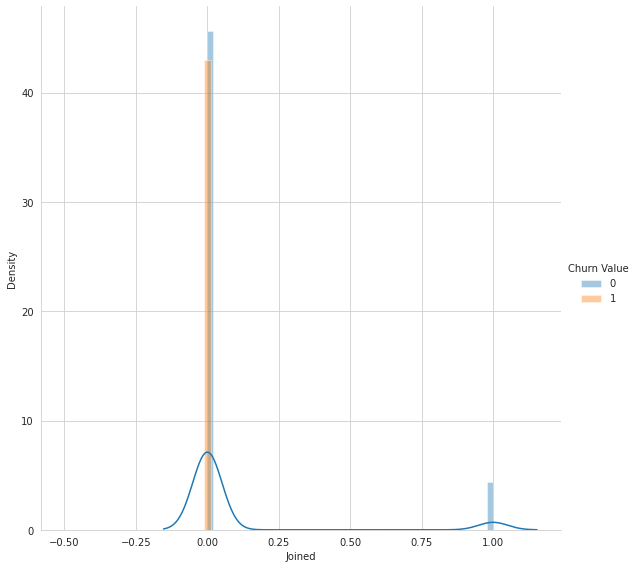

In [ ]:
sns.FacetGrid(df_cusStat,height=8, hue='Churn Value').map(sns.distplot,'Joined').add_legend()
plt.show()

It is clear that Customers who have just joined have 0% churn rate, though it is only a small part of the dataset. While the other 2 values in this feature namely - Churned or Stayed are basically the churn labels and hence useless, We can use the Joined - Yes/No information in this feature.

**Internet Service and Internet Type**

In [ ]:
df['Internet Service'].value_counts()

Fiber optic    3096
DSL            2421
No             1526
Name: Internet Service, dtype: int64

In [ ]:
df['Internet Type'].value_counts()

Fiber Optic    3035
DSL            1652
None           1526
Cable           830
Name: Internet Type, dtype: int64

The Internet Type feature gives all the categories of Internet connections - DSL operates through phone lines and offers the least speed, followed by Cable - which transmits data through cables. Fiber Optic, used optical glass fibers to transmit data as light with very minimal losses and hence gives the best speeds.

No Internet information is consistent at 1526 which is a good thing as there is no ambiquity betweent he two features here.

Possibly Cable users were erroneously grouped under DSL and some in Fiber. Hence the Internet Service feature can be dropped, as it does not give all the categories of internet connection types.

In [ ]:
df.drop('Internet Service', axis = 1, inplace = True)

In [ ]:
df.shape

(7043, 46)

In [ ]:
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Phone Service,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Streaming Music,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,Yes,No,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239,Competitor made better offer,No,0,2,None,10.47,DSL,21,No,Yes,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,Yes,No,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701,Moved,No,0,2,None,9.12,Fiber Optic,51,No,Yes,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,Yes,Yes,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1,86,5372,Moved,No,0,8,None,12.15,Cable,26,Yes,Yes,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,Yes,Yes,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003,Moved,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1,89,5340,Competitor had better devices,No,0,49,None,44.33,Fiber Optic,11,Yes,Yes,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,15140


Features with duplicate information and features that are not useful for training the model have been dropped. We save this processed dataset.

**Data Quality Check**

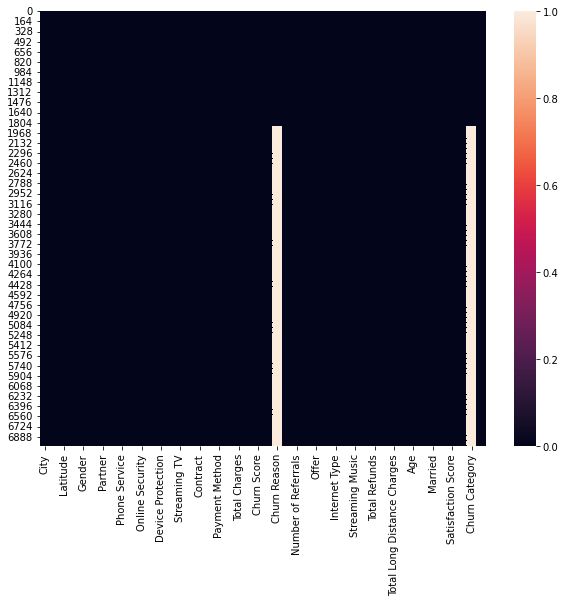

In [ ]:
plt.subplots(figsize=(10,8))
sns.heatmap(df.isnull())
plt.show()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 46 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   City                               7043 non-null   object 
 1   Zip Code                           7043 non-null   int64  
 2   Latitude                           7043 non-null   float64
 3   Longitude                          7043 non-null   float64
 4   Gender                             7043 non-null   object 
 5   Senior Citizen                     7043 non-null   object 
 6   Partner                            7043 non-null   object 
 7   Dependents                         7043 non-null   object 
 8   Phone Service                      7043 non-null   object 
 9   Multiple Lines                     7043 non-null   object 
 10  Online Security                    7043 non-null   object 
 11  Online Backup                      7043 non-null   objec

There seems to no NULL values in the dataset. Churn Category and Churn Reason have empty values, where the customers have not churned - which is correct.

In [ ]:
df[df['Referred a Friend']=='No']['Number of Referrals'].unique()

array([0])

In [ ]:
df[df['Referred a Friend']=='Yes']['Number of Referrals'].unique()

array([ 6,  1,  4,  5,  2,  3,  7,  9,  8, 10, 11])

Referral information is consistent

In [ ]:
df[df['Age']<30]['Under 30'].value_counts()

Yes    1401
Name: Under 30, dtype: int64

Under 30 information is consistent and valid

In [ ]:
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Phone Service,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Streaming Music,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,Yes,No,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239,Competitor made better offer,No,0,2,None,10.47,DSL,21,No,Yes,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,Yes,No,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701,Moved,No,0,2,None,9.12,Fiber Optic,51,No,Yes,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,Yes,Yes,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,1,86,5372,Moved,No,0,8,None,12.15,Cable,26,Yes,Yes,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,Yes,Yes,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003,Moved,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,1,89,5340,Competitor had better devices,No,0,49,None,44.33,Fiber Optic,11,Yes,Yes,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,15140


Total Charges feature is of Object datatype. There seems to be cells with multiple datatypes

In [ ]:
dtSet = set()
lst = []
for i in range(len(df['Total Charges'])):
  dtSet.add(type(df['Total Charges'][i]))  
  if('str' in str(type(df['Total Charges'][i]))):
    lst.append(i)
print(dtSet)

{<class 'float'>, <class 'str'>, <class 'int'>}


In [ ]:
for i in lst:
  print('*'+df.iloc[i]['Total Charges']+'*')

* *
* *
* *
* *
* *
* *
* *
* *
* *
* *
* *


String values are basically emptly cells. Let us replace them with NULL - to convert this feature float.

In [ ]:
# Replace empty strings with Null
df.loc[df['Total Charges']==' ','Total Charges'] = None

In [ ]:
df['Total Charges'] = pd.to_numeric(df['Total Charges'])

We will have to tackle the NAN values we have added instead of the empty strings during preprocessing.

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 46 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   City                               7043 non-null   object 
 1   Zip Code                           7043 non-null   int64  
 2   Latitude                           7043 non-null   float64
 3   Longitude                          7043 non-null   float64
 4   Gender                             7043 non-null   object 
 5   Senior Citizen                     7043 non-null   object 
 6   Partner                            7043 non-null   object 
 7   Dependents                         7043 non-null   object 
 8   Phone Service                      7043 non-null   object 
 9   Multiple Lines                     7043 non-null   object 
 10  Online Security                    7043 non-null   object 
 11  Online Backup                      7043 non-null   objec

Check for empty strings

In [ ]:
np.where(df.applymap(lambda x : x ==''))

(array([], dtype=int64), array([], dtype=int64))

In [ ]:
np.where(df.applymap(lambda x : x ==' '))

(array([], dtype=int64), array([], dtype=int64))

###**Exploratory Data Analysis**

In [ ]:
# Get a summary of Non numeric columns
objLst = list(df.select_dtypes(include=['object']).columns.sort_values())
for col in objLst:
  print('***'+col+'***')
  print(df[col].value_counts())
  print('-'*50)

***Churn Category***
Competitor         841
Attitude           314
Dissatisfaction    303
Price              211
Other              200
Name: Churn Category, dtype: int64
--------------------------------------------------
***Churn Reason***
Attitude of support person                   192
Competitor offered higher download speeds    189
Competitor offered more data                 162
Don't know                                   154
Competitor made better offer                 140
Attitude of service provider                 135
Competitor had better devices                130
Network reliability                          103
Product dissatisfaction                      102
Price too high                                98
Service dissatisfaction                       89
Lack of self-service on Website               88
Extra data charges                            57
Moved                                         53
Limited range of services                     44
Long distance charges   

In [ ]:
# Get a summary of Numeric columns
numLst = list(df.select_dtypes(exclude=['object']).columns.sort_values())
for col in numLst:
  print('***'+col+'***')
  print(df[col].describe())
  print('-'*50)

***Age***
count    7043.000000
mean       46.509726
std        16.750352
min        19.000000
25%        32.000000
50%        46.000000
75%        60.000000
max        80.000000
Name: Age, dtype: float64
--------------------------------------------------
***Avg Monthly GB Download***
count    7043.000000
mean       20.515405
std        20.418940
min         0.000000
25%         3.000000
50%        17.000000
75%        27.000000
max        85.000000
Name: Avg Monthly GB Download, dtype: float64
--------------------------------------------------
***Avg Monthly Long Distance Charges***
count    7043.000000
mean       22.958954
std        15.448113
min         0.000000
25%         9.210000
50%        22.890000
75%        36.395000
max        49.990000
Name: Avg Monthly Long Distance Charges, dtype: float64
--------------------------------------------------
***CLTV***
count    7043.000000
mean     4400.295755
std      1183.057152
min      2003.000000
25%      3469.000000
50%      4527.00000

In [ ]:
df.head()

,City,Zip Code,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Phone Service,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Value,Churn Score,CLTV,Churn Reason,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Avg Monthly Long Distance Charges,Internet Type,Avg Monthly GB Download,Streaming Music,Unlimited Data,Total Refunds,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Age,Under 30,Married,Number of Dependents,Satisfaction Score,Customer Status,Churn Category,Population
0,Los Angeles,90003,33.964131,-118.272783,Male,No,No,No,Yes,No,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,1,86,3239,Competitor made better offer,No,0,2,None,10.47,DSL,21,No,Yes,0.0,0,20.94,129.09,37,No,No,0,1,Churned,Competitor,58198
1,Los Angeles,90005,34.059281,-118.307420,Female,No,No,Yes,Yes,No,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,1,67,2701,Moved,No,0,2,None,9.12,Fiber Optic,51,No,Yes,0.0,0,18.24,169.89,19,Yes,No,2,2,Churned,Other,43019
2,Los Angeles,90006,34.048013,-118.293953,Female,No,No,Yes,Yes,Yes,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.50,1,86,5372,Moved,No,0,8,None,12.15,Cable,26,Yes,Yes,0.0,0,97.20,917.70,31,No,No,2,3,Churned,Other,62784
3,Los Angeles,90010,34.062125,-118.315709,Female,No,Yes,Yes,Yes,Yes,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,1,84,5003,Moved,No,0,28,Offer C,4.89,Fiber Optic,47,Yes,Yes,0.0,0,136.92,3182.97,23,Yes,Yes,3,3,Churned,Other,1957
4,Los Angeles,90015,34.039224,-118.266293,Male,No,No,Yes,Yes,Yes,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.30,1,89,5340,Competitor had better devices,No,0,49,None,44.33,Fiber Optic,11,Yes,Yes,0.0,0,2172.17,7208.47,38,No,No,1,1,Churned,Competitor,15140


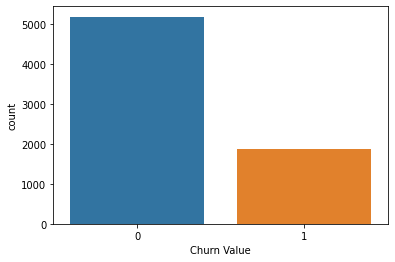

In [ ]:
sns.countplot(x=df['Churn Value'])
plt.show()

In [ ]:
len(df[df['Churn Value']==0])*100/len(df['Churn Value'])

73.46301292063042

Clearly the dataset is imbalanced. About 3/4th of the customers do not churn in the given quarter - Q3. Which is understandable in the Industry - customers leaving the service provider is quite low, when compared to the customers who stay on as a general thumb rule.

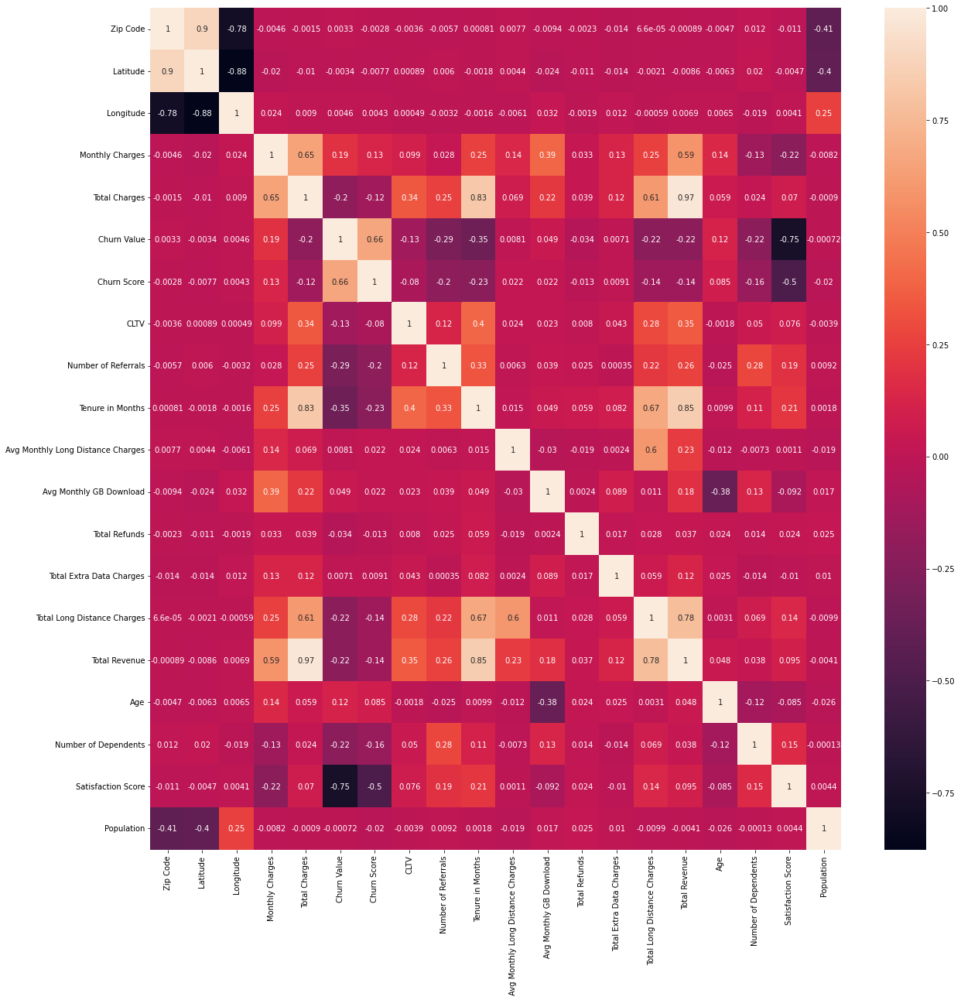

In [ ]:
plt.subplots(figsize=(20,20))
sns.heatmap(df.corr(), annot=True)
plt.show()

The above plot shows the correlation between the features and also the churn label. Other than the total revenue being correlated to the individual charges and tenure with the service provider - nothing stands out in this plot. We will go down deeper.

In [ ]:
cols = list(df.columns)
len(cols)
# numLst
# objLst

46

<Figure size 2160x2160 with 0 Axes>

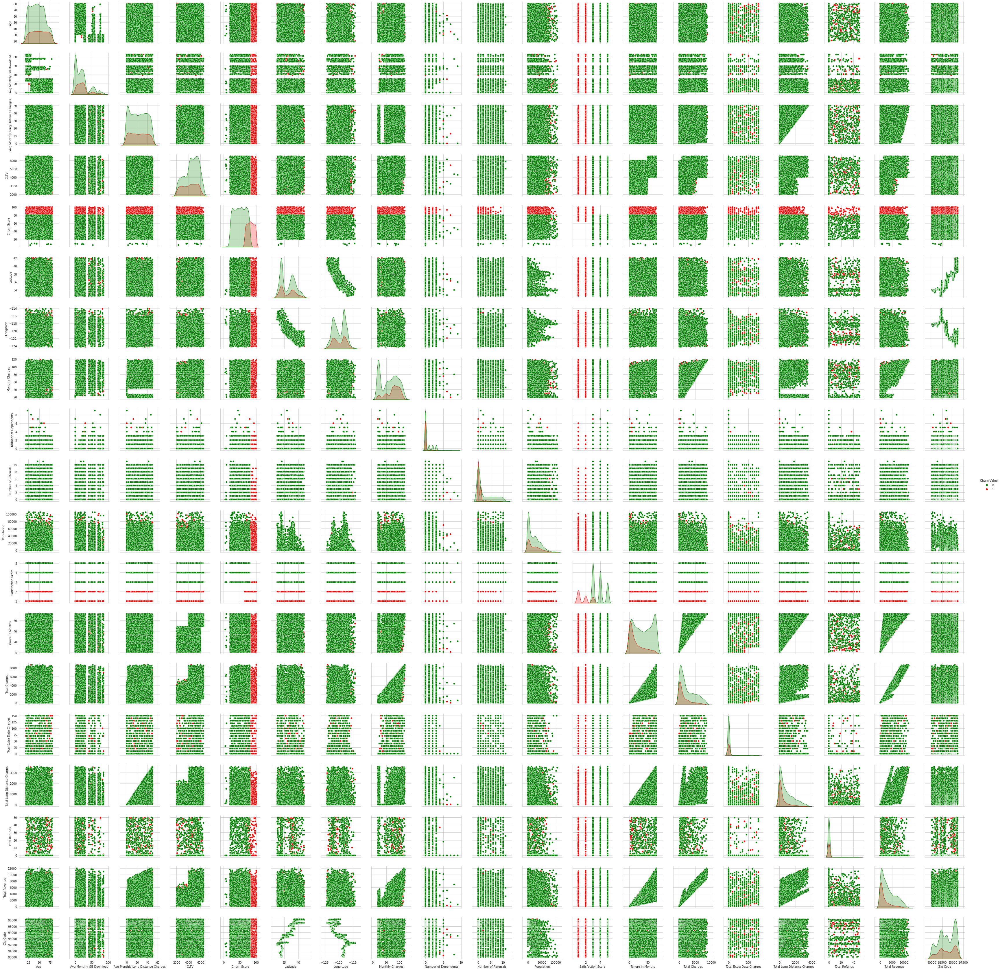

In [ ]:
plt.figure(figsize=(50,50))
#sns.set(font_scale=1)
sns.set_style("whitegrid");
sns.pairplot(df[numLst],hue = 'Churn Value', palette=['green','red'])
plt.show()

The following features seem to impact the Class separation:
1. Churn Score - It clearly separates the classes. As Score increases, churn risk also increases.

2. Satisfaction Score - Here again, A score of 3 and above reduces churn probability

3. Tenure in Months - As Tenure increases churn risk decreases

4. Total Revenue - As Total Revenue increases churn risk decreases as customer investment is higher.

5. Age - We would need to investigate if there are some "steps" in the age values - where the churn class labels can be split into

Rest of the features don't stand out distinctly in terms of correlation with the churn value or in correlation with other features.

We will delve deeper into the above features in the coming sections.

Zip code is really not a numeric feature. It is makes sense categorize it because it gives the area with in a city. 

In [ ]:
df['Zip Code'].nunique()

1652

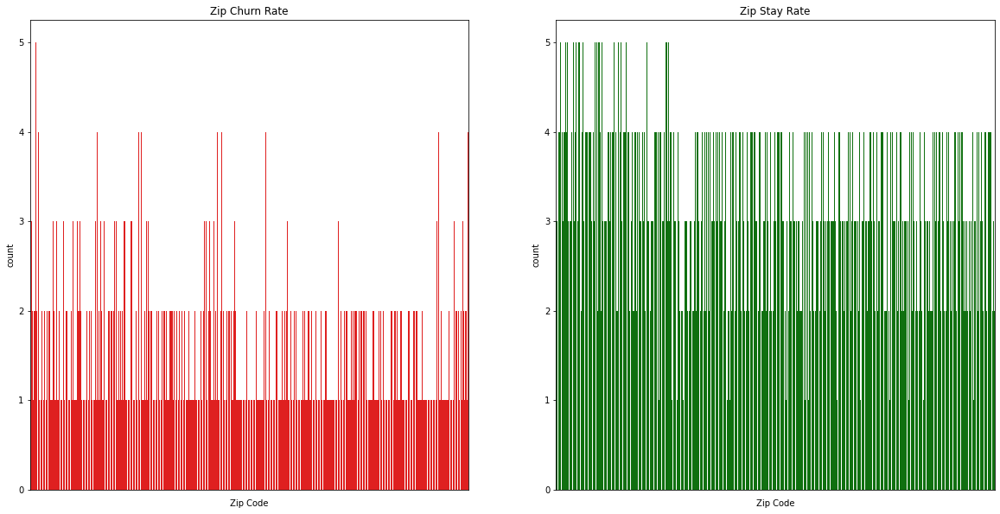

In [ ]:
# Visualize Churn and Stay Rate trends with respect to Zip Codes.
plt.subplots(figsize=(20,10))

plt.subplot(1,2,1)
cp1 = sns.countplot(x = 'Zip Code', data = df[df['Churn Value']==1][['Zip Code','Churn Value']],color='red')
cp1.set(title='Zip Churn Rate')
cp1.set(xticklabels=[])
cp1.tick_params(bottom=False)

plt.subplot(1,2,2)
cp2 = sns.countplot(x = 'Zip Code', data = df[df['Churn Value']==0][['Zip Code','Churn Value']],color='green')
cp2.set(title='Zip Stay Rate')
cp2.set(xticklabels=[]) 
cp2.tick_params(bottom=False)

plt.show()

The maximum frequency of a given zipcode occuring in the dataset is 5. 
We can see that a churn count of 1 per zipcode is the most probable value, while the stay rates are common in the 1-5 range.

Most of the zip code locations have over a 100 customers and there are around 1652 unique zip codes. Hence traditional one-hot-encoding is not a good idea. 
We can try transforming zipcode feature, to the churn rate in that particular location.

In [ ]:
dfZip = pd.DataFrame(data= df['Zip Code'], columns = ['Zip Code'])

In [ ]:
# Apply transformation
dfZip['LocChurnRate'] = dfZip['Zip Code'].apply(lambda x: len(df[(df['Zip Code']==x) & (df['Churn Value']==1) ])/len(df[df['Zip Code']==x]) )

In [ ]:
dfZip['LocChurnRate'].value_counts()

0.25    1996
0.00    1941
0.50    1112
0.20     825
0.40     620
0.75     224
0.60     200
1.00      65
0.80      60
Name: LocChurnRate, dtype: int64

In [ ]:
# These zip code locations have had 100% churn of customers
dfZip[dfZip['LocChurnRate']==1].groupby('Zip Code').count()

,LocChurnRate
Zip Code,
90020,5
92397,4
93110,4
93252,4
93272,4
93528,4
93711,4
94014,4
95006,4


In [ ]:
df.loc[dfZip['LocChurnRate']==1, ['Zip Code','Churn Category','Churn Reason']]

,Zip Code,Churn Category,Churn Reason
5,90020,Competitor,Competitor offered higher download speeds
121,92397,Price,Price too high
154,93110,Competitor,Competitor had better devices
169,93252,Competitor,Competitor offered higher download speeds
173,93272,Competitor,Competitor had better devices
...,...,...,...
1710,95984,Dissatisfaction,Service dissatisfaction
1723,96032,Competitor,Competitor offered more data
1748,96150,Other,Attitude of service provider
1749,96161,Competitor,Attitude of service provider


It doesnt look like these zipcode locations, had bad network - from the above reason for churn. It seems do more with more value from the competitors.

In [ ]:
dfZip[['Churn Value','Churn Score', 'Satisfaction Score']] = df[['Churn Value','Churn Score', 'Satisfaction Score']]

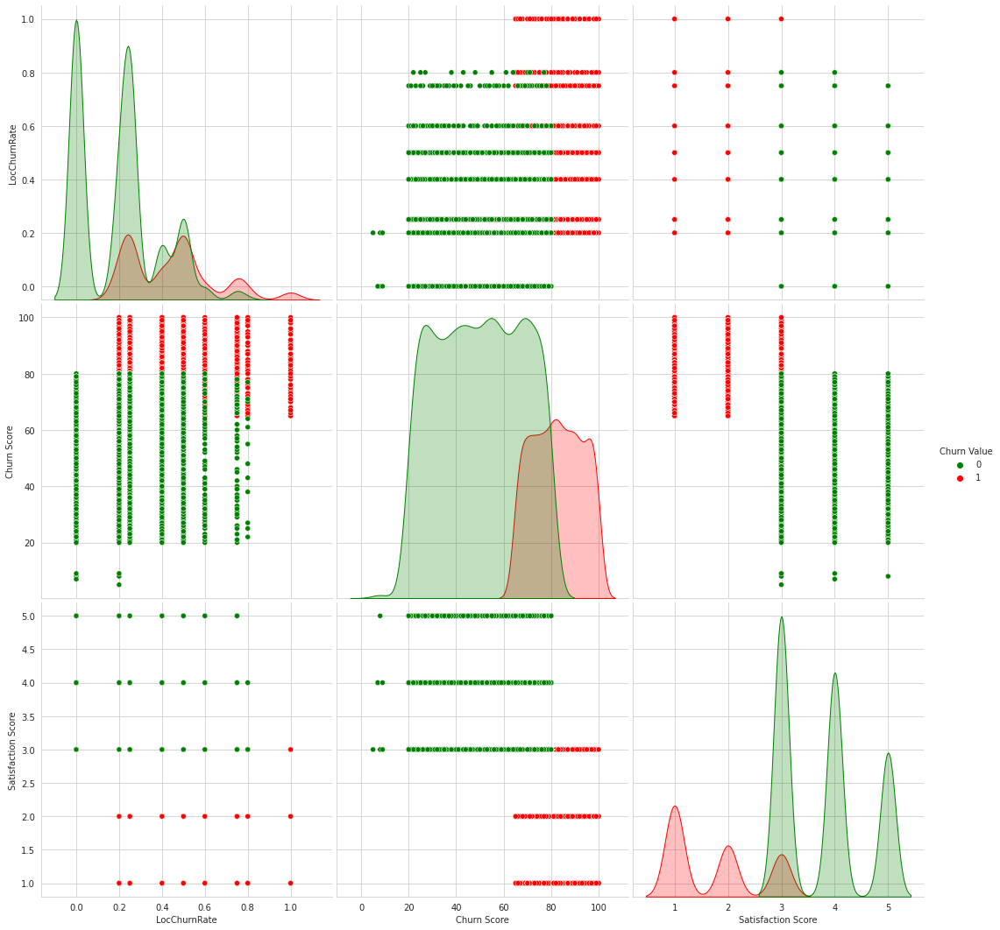

In [ ]:
sns.set_style("whitegrid");
sns.pairplot(dfZip.drop('Zip Code', axis=1),hue = 'Churn Value', palette=['green','red'],height=5)
plt.show()

The classes are clearly seperable at churn rate 1 and 0 as expected. The churn score and the satisfaction scores also seem to agree with this at the extremes. I the mid range, ofcourse we have good overlap. In any case this LocChurnRate feature is more valuable, interpretable and learnable than the zipcode feature.

In [ ]:
colList = objLst
colList.remove('Churn Category')
colList.remove('Churn Reason')
colList.remove('City')
len(colList)

23

Snap shot of key categorical Features


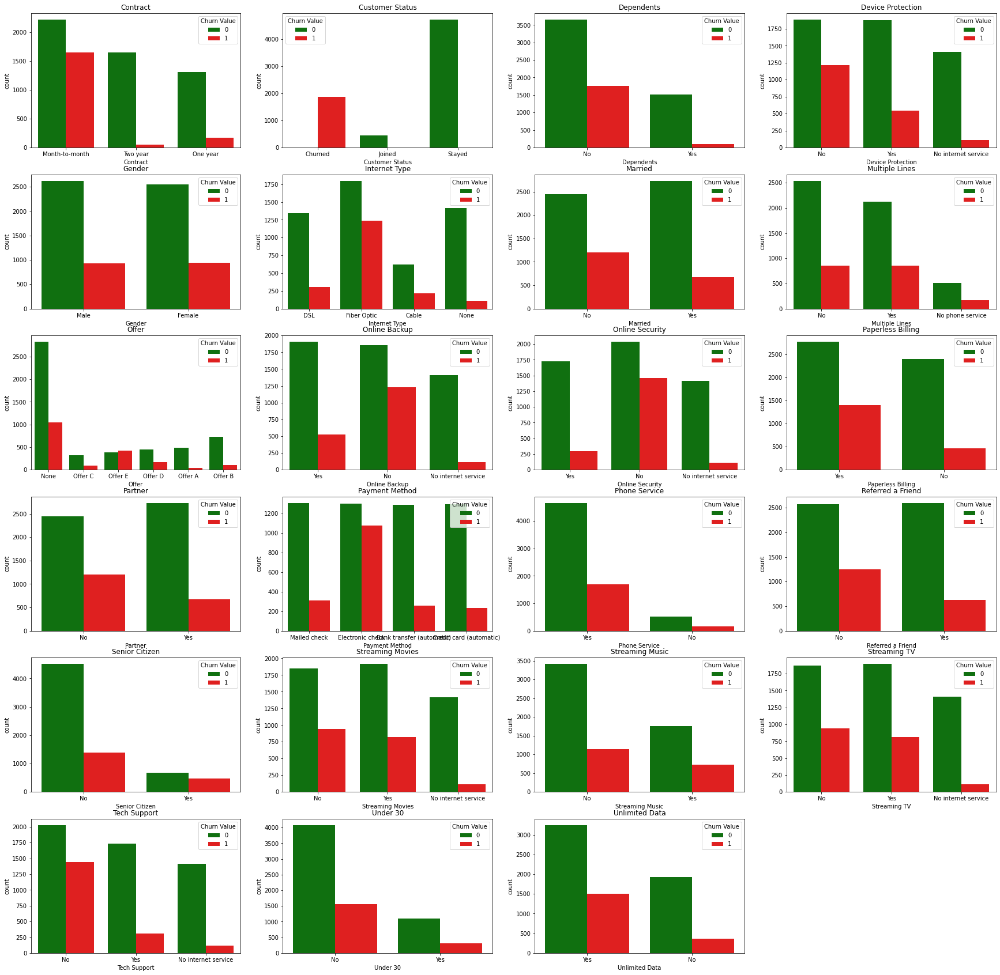

In [ ]:
print("Snap shot of key categorical Features")
plt.subplots(figsize=(30,30))
for i in range(len(colList)):
  plt.subplot(6,4,i+1)
  sns.countplot(x = colList[i], data = df, hue = "Churn Value", palette=['green','red']).set_title(colList[i]);

Inferences:
1. The chance of churning reduces as the contract period increases. Month to Month contract customers have the highest churn risk. Possibly due to absence of any contractual obligations

2. Customers with dependents and customers with device protection plan - have lower churn.

3. Gender doesn't seem to be a very good feature to separate the classes.

4. Fiber Optic subscribers, possibly people who consume high speed internet, seem to have a higher churn when comparted to other Internet types. They may be opting for better speed networks.

5. As the number of Referrals made by a customer increases, the risk of churn for that customer decreases.

6. From the demographics point of view, customers who are married/have dependents, partners or senior citizens seem to churn less - understandably as they have by now experimented and settled with the service provider.

7. Customers who have purchased add on facilities like Online back up, security, protection plan etc - seem to be more loyal to the service provider. And are investing in their products.

8. Contrary to common belief that younger customers have a tendency to churn more at the outset. We will have to analyse this feature further.

In [ ]:
df.loc[(df['Offer']=='Offer E')]['Churn Value'].value_counts()

1    426
0    379
Name: Churn Value, dtype: int64

In [ ]:
df.loc[(df['Offer']=='Offer E')&(df['Churn Value']==1),['Churn Reason']].value_counts()

Churn Reason                             
Attitude of support person                   48
Attitude of service provider                 46
Competitor made better offer                 41
Competitor offered higher download speeds    37
Competitor had better devices                34
Competitor offered more data                 34
Don't know                                   34
Network reliability                          28
Price too high                               16
Service dissatisfaction                      16
Product dissatisfaction                      15
Lack of self-service on Website              14
Extra data charges                           13
Moved                                        12
Limited range of services                    11
Lack of affordable download/upload speed     10
Long distance charges                         8
Poor expertise of online support              4
Poor expertise of phone support               4
Deceased                                      

Offer E seems to have more customer churned than that stayed.

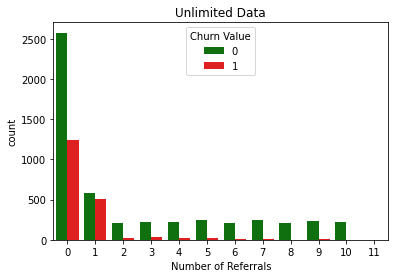

In [ ]:
sns.countplot(x = 'Number of Referrals', data = df, hue = "Churn Value", palette=['green','red']).set_title(colList[i]);

As the number of Referrals made by a customer increases, the risk of churn for that customer decreases.



In [ ]:
df[df['Churn Value']==1]['Under 30'].value_counts()

No     1565
Yes     304
Name: Under 30, dtype: int64

In [ ]:
df[df['Churn Value']==1]['Under 30'].value_counts()['Yes']/len(df[df['Churn Value']==1]['Under 30'])

0.16265382557517388

In [ ]:
df[df['Churn Value']==0]['Under 30'].value_counts()

No     4077
Yes    1097
Name: Under 30, dtype: int64

In [ ]:
df[df['Churn Value']==0]['Under 30'].value_counts()['Yes']/len(df[df['Churn Value']==0]['Under 30'])

0.21202164669501353

Contrary to common belief that younger customers have a tendency to churn more, only 16% of the total churn came from the category of under 30. We would need to study the Age feature closely to understand any pattern.

In [ ]:
df['Churn Category'].value_counts()

Competitor         841
Attitude           314
Dissatisfaction    303
Price              211
Other              200
Name: Churn Category, dtype: int64

In [ ]:
df['Churn Category'].value_counts()[:2].sum()/len(df[df['Churn Value']==1])

0.6179775280898876

In [ ]:
df['Churn Reason'].value_counts()

Attitude of support person                   192
Competitor offered higher download speeds    189
Competitor offered more data                 162
Don't know                                   154
Competitor made better offer                 140
Attitude of service provider                 135
Competitor had better devices                130
Network reliability                          103
Product dissatisfaction                      102
Price too high                                98
Service dissatisfaction                       89
Lack of self-service on Website               88
Extra data charges                            57
Moved                                         53
Limited range of services                     44
Long distance charges                         44
Lack of affordable download/upload speed      44
Poor expertise of phone support               20
Poor expertise of online support              19
Deceased                                       6
Name: Churn Reason, 

In [ ]:
df['Churn Reason'].value_counts()[:7].sum()/len(df[df['Churn Value']==1])

0.5896201177100053

Around 60% of the customers leaving the Telecom Service Provider leave due to better value from competitors and unsatisfactory attitude of company representatives. There is a huge opportunity for improvement here.

In [ ]:
print("Top 20 cities based on Churn Rates")
df.groupby('City').sum()['Churn Value'].sort_values(ascending=False)[:20]

Top 20 cities based on Churn Rates


City
Los Angeles        90
San Diego          50
San Francisco      31
San Jose           29
Sacramento         26
Fresno             16
Long Beach         15
Oakland            13
Glendale           13
Stockton           12
Modesto            12
Santa Rosa         11
Santa Barbara      10
Berkeley            9
North Hollywood     9
Pasadena            9
San Bernardino      8
Riverside           8
Torrance            8
Fremont             7
Name: Churn Value, dtype: int64

In [ ]:
df['City'].nunique()


1129

There are over a thousand cities. Hence categorizing it would not be a good idea. We could replace each city with the churn rate of that city and see how the results looks like.

In [ ]:
dfcity = pd.DataFrame(df['City'], columns = ['City'])

In [ ]:
dfcity['CityRate'] = dfcity['City'].apply(lambda x: len(df[(df['City']==x) & (df['Churn Value']==1) ])/len(df[df['City']==x]))

In [ ]:
dfcity.CityRate.value_counts()

0.250000    1792
0.000000    1259
0.500000     760
0.200000     610
0.400000     315
0.295082     305
0.333333     252
0.750000     160
0.300000     120
0.258929     112
0.375000     112
0.600000     110
0.240741     108
0.298077     104
0.125000      96
0.100000      90
0.166667      66
0.312500      64
1.000000      48
0.272727      44
0.075000      40
0.325000      40
0.281250      32
0.187500      32
0.066667      30
0.178571      28
0.285714      28
0.357143      28
0.428571      28
0.320000      25
0.240000      25
0.458333      24
0.450000      20
0.800000      20
0.150000      20
0.437500      16
0.625000      16
0.266667      15
0.133333      15
0.083333      12
0.416667      12
0.700000      10
Name: CityRate, dtype: int64

In [ ]:
dfcity[['Churn Value','Churn Score', 'Satisfaction Score']] = df[['Churn Value','Churn Score', 'Satisfaction Score']]

In [ ]:
dfcity.head(5)

,City,CityRate,Churn Value,Churn Score,Satisfaction Score
0,Los Angeles,0.295082,1,86,1
1,Los Angeles,0.295082,1,67,2
2,Los Angeles,0.295082,1,86,3
3,Los Angeles,0.295082,1,84,3
4,Los Angeles,0.295082,1,89,1


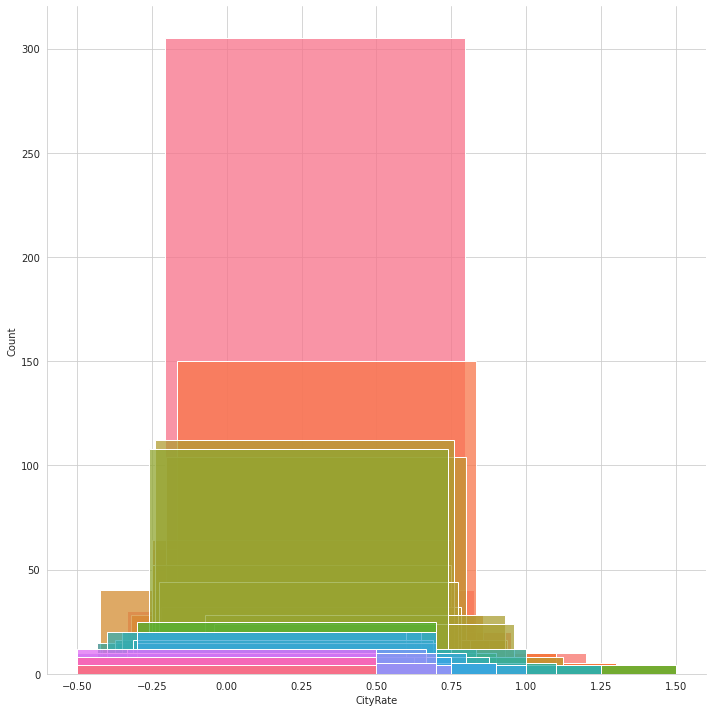

In [ ]:
sns.FacetGrid(dfcity,hue='City',height=10).map(sns.histplot,'CityRate')
plt.show()

Around 300 cities have a churn rate of around 25% and around 150 cities have a churn rate of about 30%. These two categories put together, will add up to 40% of the cities in the data set. 

40% of the cities fall in the churnrate range of 25-30% which is the most frequent window.

Now, let us analyse some numeric features

AGE

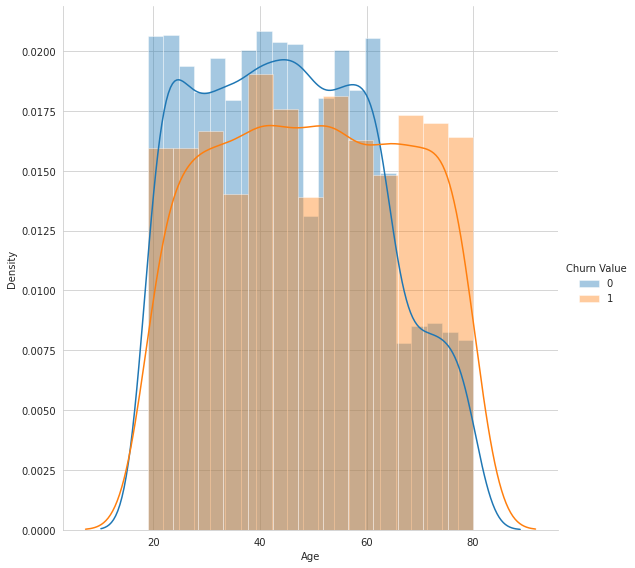

In [ ]:
sns.FacetGrid(df,hue='Churn Value',height=8).map(sns.distplot,'Age').add_legend()
plt.show()


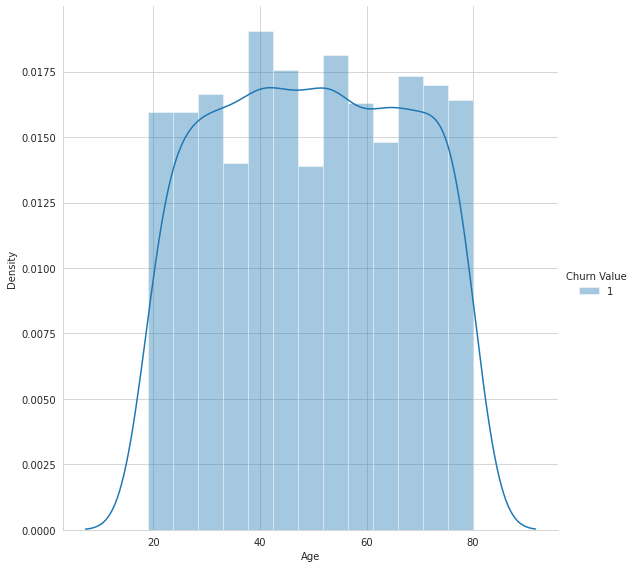

In [ ]:
sns.FacetGrid(df[df['Churn Value']==1],hue='Churn Value',height=8).map(sns.distplot,'Age').add_legend()
plt.show()

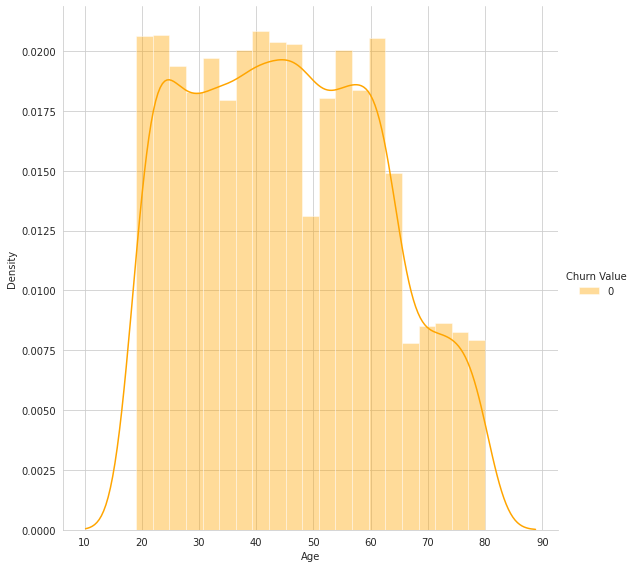

In [ ]:
sns.FacetGrid(df[df['Churn Value']==0],hue='Churn Value',height=8, palette=['orange']).map(sns.distplot,'Age').add_legend()
plt.show()

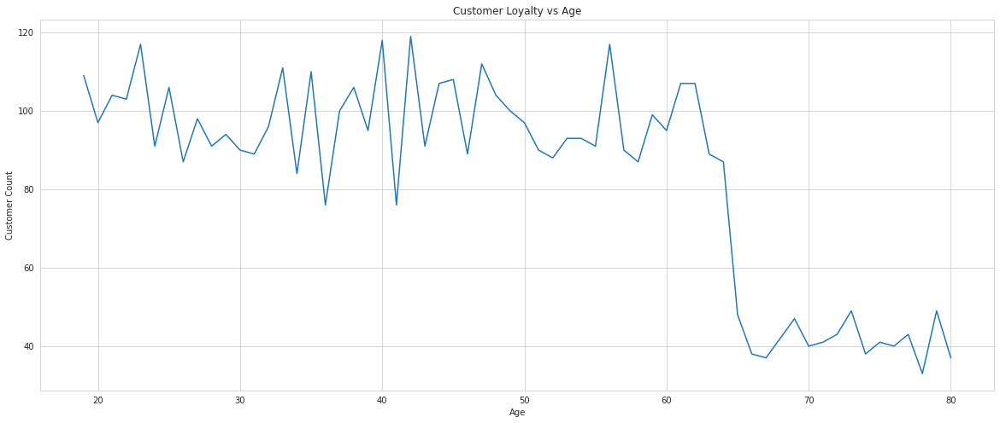

In [ ]:
plt.subplots(figsize=(20,8))
df[df['Churn Value']==0].groupby('Age').count()['Customer Status'].plot()
plt.title('Customer Loyalty vs Age')
plt.ylabel('Customer Count')
plt.show()

It is very clearly visible from the dist plots, that from age of 65, there is a distinct trend for customers to churn. Possibly around the time of retirement, they go for lower specifications/ lower price offerings.

However, we must check the general customer age profile with the Service provider

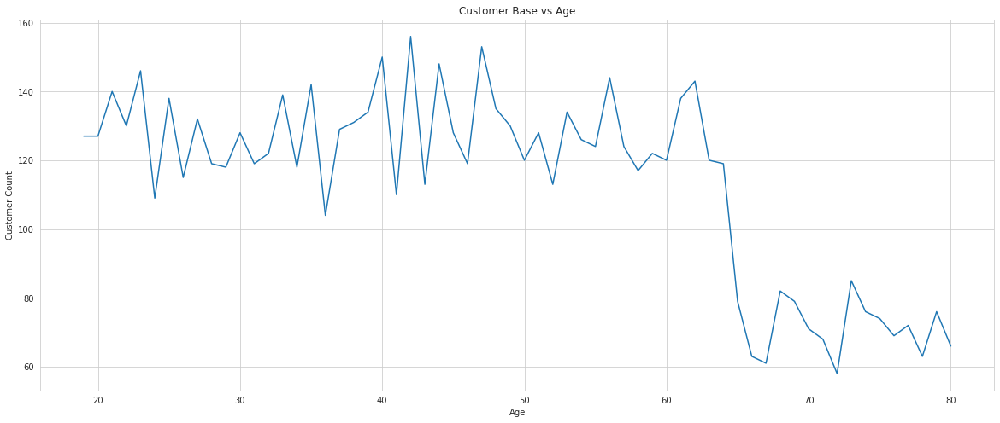

In [ ]:
plt.subplots(figsize=(20,8))
df.groupby('Age').count()['Customer Status'].plot()
plt.title('Customer Base vs Age')
plt.ylabel('Customer Count')
plt.show()

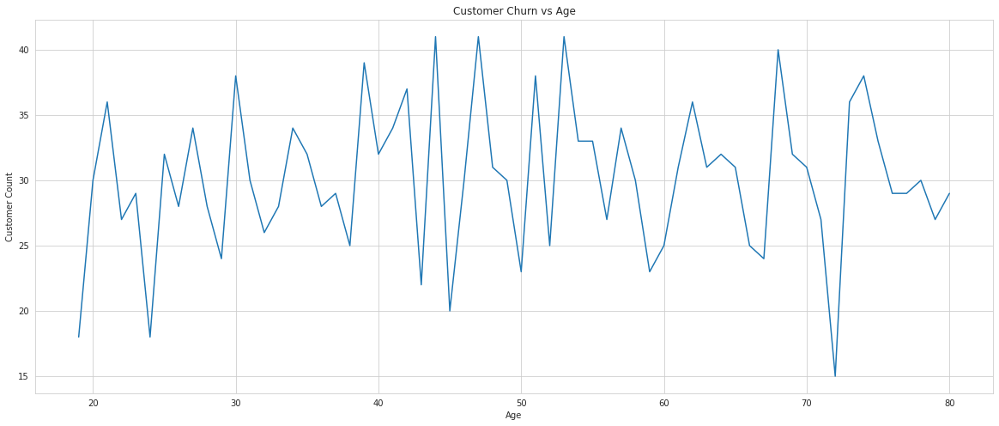

In [ ]:
plt.subplots(figsize=(20,8))
df[df['Churn Value']==1].groupby('Age').count()['Customer Status'].plot()
plt.title('Customer Churn vs Age')
plt.ylabel('Customer Count')
plt.show()

As we can see, there is a sharp fall in the customer base from the age of 65 and above. And the customer loyalty (Churn Value = 0) keeps this trend and falls sharply from 65. However, it is interesting to note that Customer Churn (Churn Value = 1) does not fall proportionately and it continues to follow the same pattern through out all age groups. There is distinct change in trend after 65.

This could contribute in separating the classes after the customer age of 65, as we inferred in the distplots above.

In [ ]:
dfage = pd.DataFrame(df['Age'], columns=['Age'])

In [ ]:
dfage['Churn Value'] = df['Churn Value']

In [ ]:
dfage['Above 64'] = df['Age'].apply(lambda x: 'Yes' if x>64 else 'No')

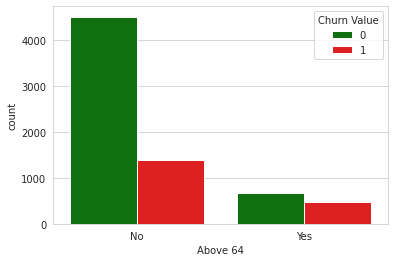

In [ ]:
sns.countplot(x = 'Above 64', data = dfage, hue = "Churn Value", palette=['green','red'])
plt.show()

The Customer loyalty falls sharply compared to the customer churn from age 65 onwards

CHURN SCORE and SATISFACTION SCORE

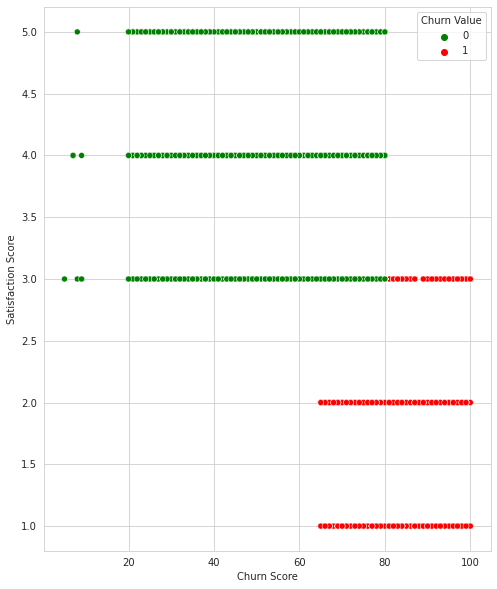

In [ ]:
plt.subplots(figsize=(8,10))
sns.scatterplot(x='Churn Score',y='Satisfaction Score',data=df,hue='Churn Value',palette=['green','red'])
plt.show()

We can clearly see that Churn score separates the 2 classes. The higher the churn score the higher the risk of the customer leaving the Telco.

Similarly higher the satisfaction score, lower the risk of leaving the company.

This is consistent with our expectations.

We will how their distributions are.

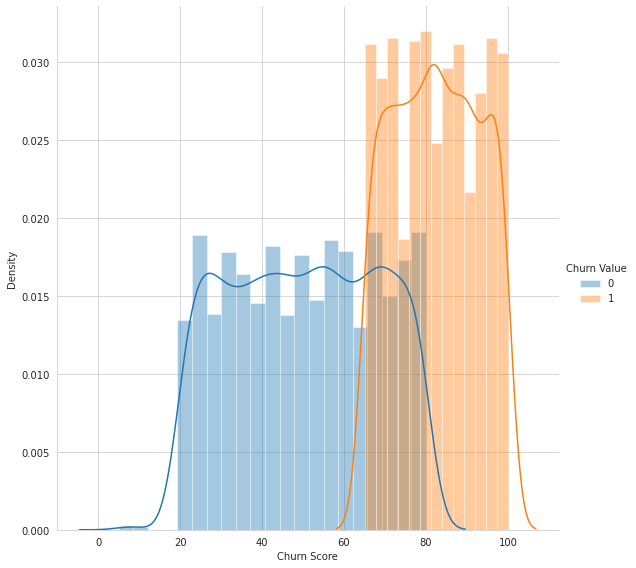

In [ ]:
sns.FacetGrid(df,hue='Churn Value',height=8).map(sns.distplot,'Churn Score').add_legend()
plt.show()

Churn Score is a very important feature in separating the classes. There is only a small overlap in the 65-80 window, even in that window the probability of churn is higher.

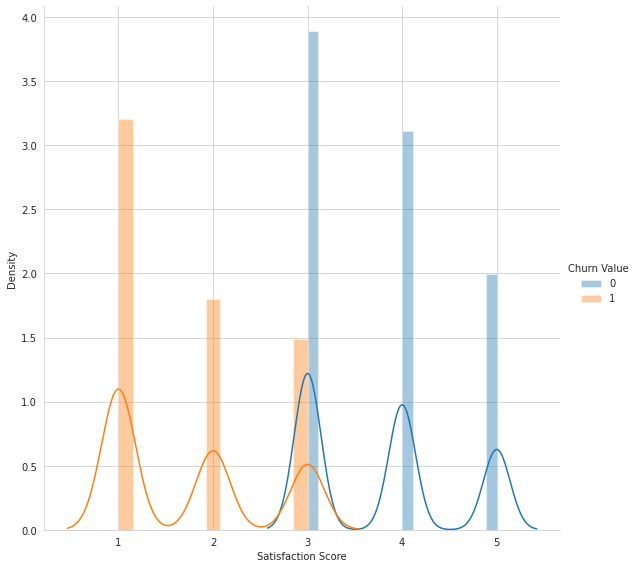

In [ ]:
sns.FacetGrid(df,hue='Churn Value',height=8).map(sns.distplot,'Satisfaction Score').add_legend()
plt.show()

Other than the neutral score of 3 - Satisfaction Score clearly separates the class. This could be another important feature, in deciding the customer churn rate.

In [ ]:
df[(df['Satisfaction Score']==3)&(df['Churn Value']==1)].count()['Satisfaction Score']/df[df['Satisfaction Score']==3].count()['Satisfaction Score']

0.16097560975609757

Only around 16% of the people who gave a score of 3 - left.

TENURE IN MONTHS

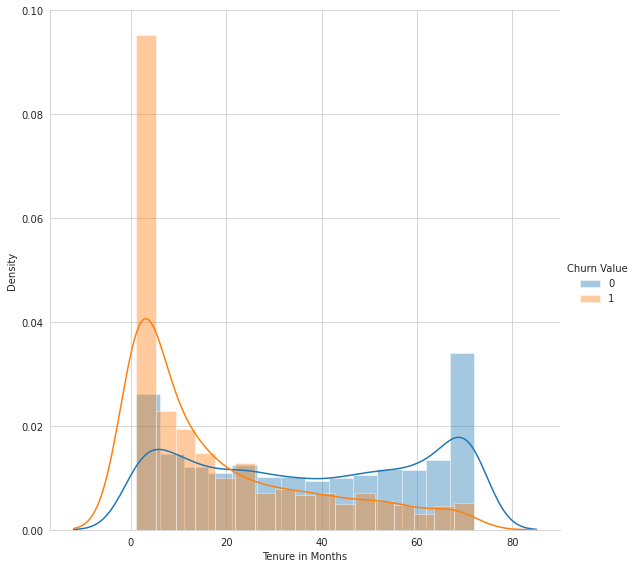

In [ ]:
sns.FacetGrid(df,hue='Churn Value',height=8).map(sns.distplot,'Tenure in Months').add_legend()
plt.show()

The churn rate seems to come down as the customer ages with the Telco. So new customers can be flagged as a higher risk category.

Let us work with some Charge, Price and Revenue components in the dataset and Analyse their effect on each other and the Class label

In [ ]:
dfCharges = pd.DataFrame(df[['Monthly Charges', 'Total Charges', 'Avg Monthly Long Distance Charges', 'Total Extra Data Charges', 'Total Long Distance Charges','Total Revenue','Total Refunds', 'Churn Value', 'Churn Score', 'Satisfaction Score']], columns = ['Monthly Charges', 'Total Charges', 'Avg Monthly Long Distance Charges', 'Total Extra Data Charges', 'Total Long Distance Charges','Total Revenue','Total Refunds', 'Churn Value', 'Churn Score', 'Satisfaction Score'])

In [ ]:
dfCharges['TestCharge'] = dfCharges['Total Charges'] + dfCharges['Total Extra Data Charges'] + dfCharges['Total Long Distance Charges'] - dfCharges['Total Refunds']

In [ ]:
len(dfCharges[np.abs(dfCharges['Total Revenue']-dfCharges['TestCharge'])>0.00000000001]) # Total Revenue has some values that are not rounded off.

0

Hence Total Revenue is nothing but the sum of Total Charges, Total Extra Data Charges, Total Long Distance Charges with the Total Refunds removed for a customer from the start of their association with Telco till the end of Quarter Q3 on Interest.

It is the total revenue that a customer has given the Telco till end of Q3.

Total Revenue is the amount that is earned by the service provider from the customer till the date as on which this dataset was extracted. (ie fromt he beginning to now)

In [ ]:
dfCharges['TestAverage'] = dfCharges['Total Long Distance Charges']/dfCharges['Avg Monthly Long Distance Charges']

In [ ]:
dfCharges['Tenure in Months'] = df['Tenure in Months']

In [ ]:
dfCharges

,Monthly Charges,Total Charges,Avg Monthly Long Distance Charges,Total Extra Data Charges,Total Long Distance Charges,Total Revenue,Total Refunds,Churn Value,Churn Score,Satisfaction Score,TestCharge,TestAverage,Tenure in Months
0,53.85,108.15,10.47,0,20.94,129.09,0.00,1,86,1,129.09,2.0,2
1,70.70,151.65,9.12,0,18.24,169.89,0.00,1,67,2,169.89,2.0,2
2,99.65,820.50,12.15,0,97.20,917.70,0.00,1,86,3,917.70,8.0,8
3,104.80,3046.05,4.89,0,136.92,3182.97,0.00,1,84,3,3182.97,28.0,28
4,103.70,5036.30,44.33,0,2172.17,7208.47,0.00,1,89,1,7208.47,49.0,49
...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,21.15,1419.40,22.77,0,1639.44,3039.53,19.31,0,45,5,3039.53,72.0,72
7039,84.80,1990.50,36.05,0,865.20,2807.47,48.23,0,59,3,2807.47,24.0,24
7040,103.20,7362.90,29.66,0,2135.52,9453.04,45.38,0,71,4,9453.04,72.0,72
7041,29.60,346.45,0.00,0,0.00,319.21,27.24,0,59,4,319.21,NaN,11


Avg Monthly Long Distance Charges is the average Long distance Charge per month for the customer, calculated from the start of his service.

From the Dataset Literature, we know that Monthly Charges is the current month Charges

Now that we have an understanding of the various Pricing features we can go ahead and delete some of the Test Features we created.

In [ ]:
dfCharges.drop(['TestCharge','TestAverage'], axis=1, inplace=True)

<Figure size 1440x1440 with 0 Axes>

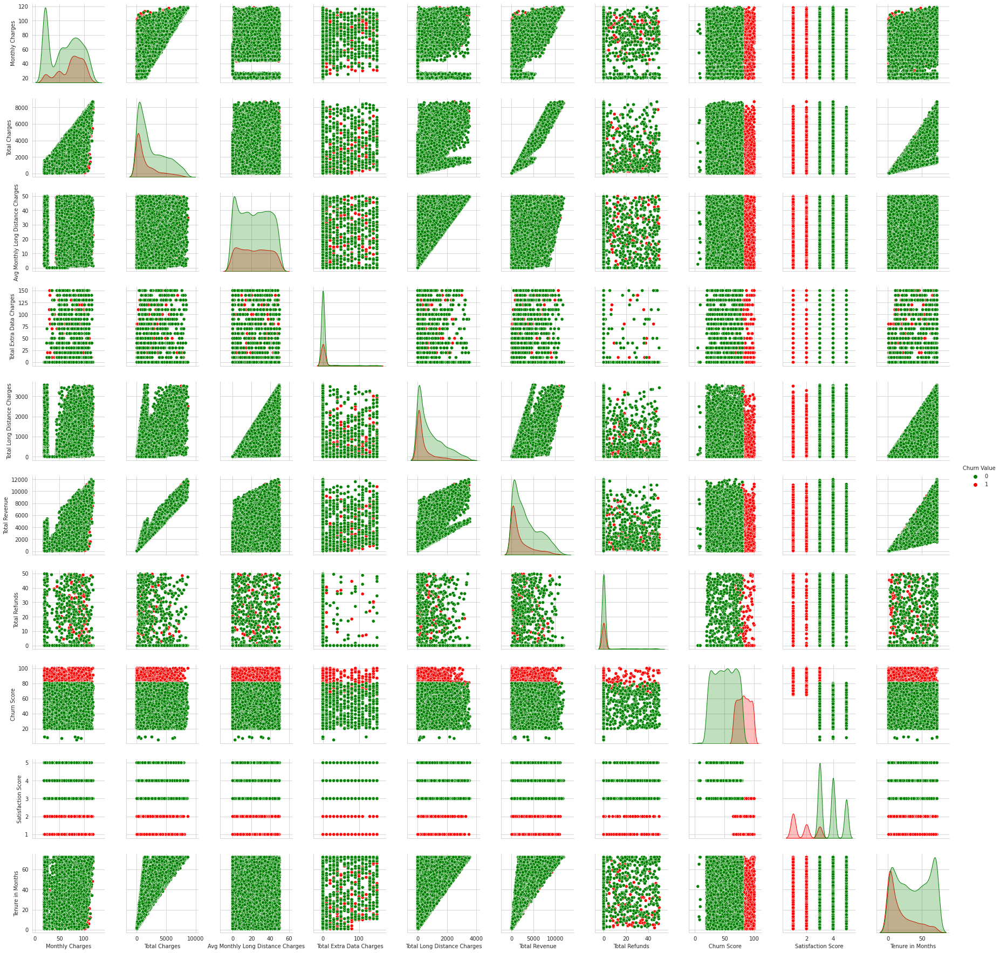

In [ ]:
plt.figure(figsize=(20,20))
sns.set_style("whitegrid")
sns.pairplot(dfCharges,hue = 'Churn Value', palette=['green','red'])
plt.show()

The different price features that we analysed in this section, don't seem to separate the classes on their own.

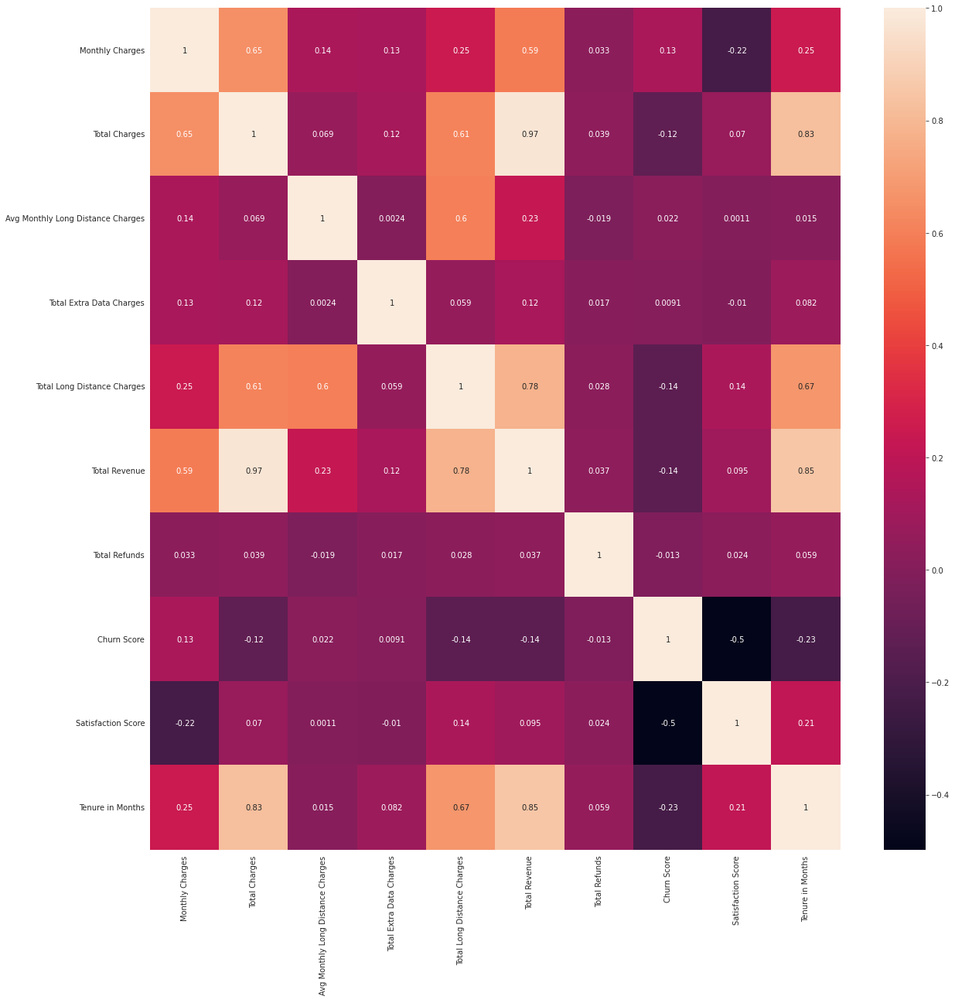

In [ ]:
plt.subplots(figsize=(20,20))
sns.heatmap(dfCharges.drop('Churn Value', axis=1).corr(), annot=True)
plt.show()

Total Revenue has some correlation with the different charge heads and Tenure in months as expected.

From the above analysis and the understanding of various pricing features, it is clear that "Total Revenue" has all the information contained in Total Charges, Total extra data Charges, Total long distance charges and Total Refund.

Given that these features do not separate the classes well and the information is repeating, we can possibly do away with these four features: Total Charges, Total extra data Charges, Total long distance charges and Total Refund.

In [ ]:
dfCharges['MonthlyRevenue'] = dfCharges['Total Revenue']/dfCharges['Tenure in Months']

In [ ]:
dfCharges['MonthlyRevenue']

0        64.545000
1        84.945000
2       114.712500
3       113.677500
4       147.111633
           ...    
7038     42.215694
7039    116.977917
7040    131.292222
7041     29.019091
7042    134.664545
Name: MonthlyRevenue, Length: 7043, dtype: float64

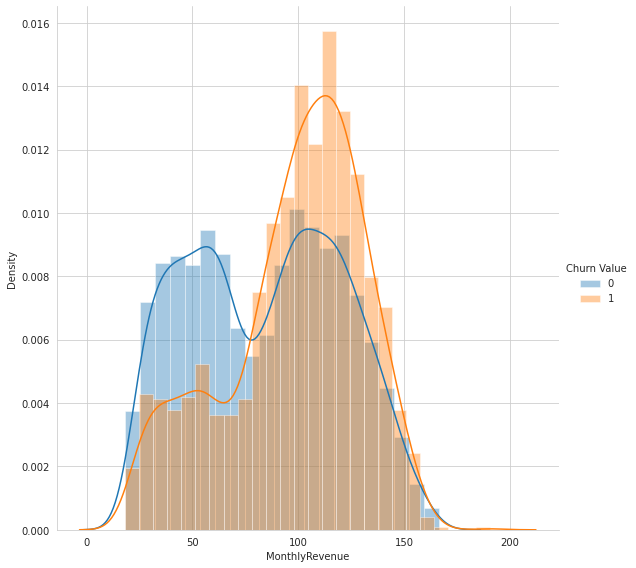

In [ ]:
sns.FacetGrid(dfCharges,hue='Churn Value',height=8).map(sns.distplot,'MonthlyRevenue').add_legend()
plt.show()

The monthly revenue is the average revenue generated by the customer for the Telco. This feature will standardize the revenue generated by the customer irrespective of the tenure.

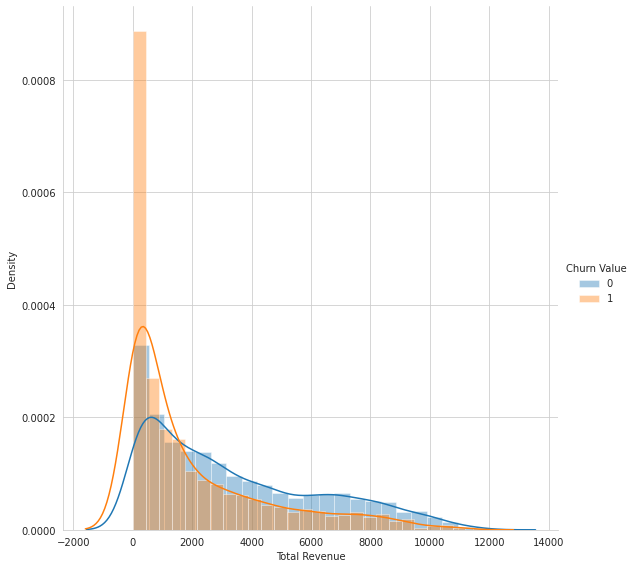

In [ ]:
sns.FacetGrid(dfCharges,hue='Churn Value',height=8).map(sns.distplot,'Total Revenue').add_legend()
plt.show()

In [ ]:
dfCharges['Total Revenue'].corr(dfCharges['Churn Score'])

-0.13777198622262574

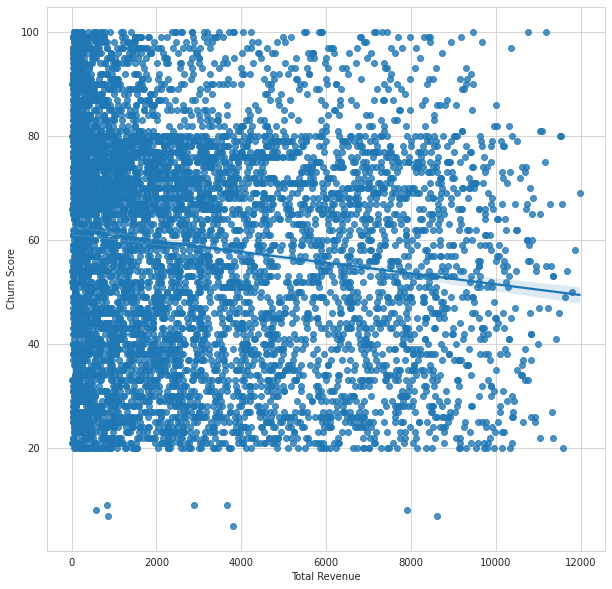

In [ ]:
plt.subplots(figsize=(10,10))
sns.regplot(x='Total Revenue', y='Churn Score', data=dfCharges)
plt.show()

From the above plots and correlation value we can see that, as the total revenue generated till current date increases, the Churn distribution falls a little more sharply than the loyal customers distribution. More revenue means, the customers have either invested more in the Telco or have stayed for a long time - both indicate loyalty and reduce the churn risk

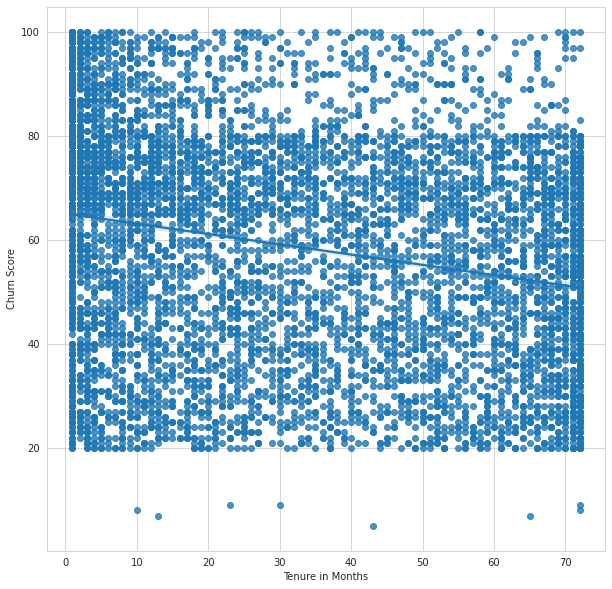

In [ ]:
plt.subplots(figsize=(10,10))
sns.regplot(x='Tenure in Months', y='Churn Score', data=dfCharges)
plt.show()

In [ ]:
dfCharges['Tenure in Months'].corr(dfCharges['Churn Score'])

-0.22544679539038015

Tenure in months has a negative correlation with the Churn Score.

In [ ]:
df.corr()['Churn Score'].sort_values(ascending= False)

Churn Score                          1.000000
Churn Value                          0.664897
Monthly Charges                      0.133754
Age                                  0.084911
Avg Monthly Long Distance Charges    0.022085
Avg Monthly GB Download              0.021885
Total Extra Data Charges             0.009107
Longitude                            0.004260
Zip Code                            -0.002769
Latitude                            -0.007684
Total Refunds                       -0.013171
Population                          -0.019855
CLTV                                -0.079782
Total Charges                       -0.124312
Total Long Distance Charges         -0.135793
Total Revenue                       -0.137772
Number of Dependents                -0.161659
Number of Referrals                 -0.202738
Tenure in Months                    -0.225447
Satisfaction Score                  -0.497979
Name: Churn Score, dtype: float64

In [ ]:
dfCharges.corr()['Churn Score'].sort_values(ascending=False)

Churn Score                          1.000000
Churn Value                          0.664897
Monthly Charges                      0.133754
MonthlyRevenue                       0.124390
Avg Monthly Long Distance Charges    0.022085
Total Extra Data Charges             0.009107
Total Refunds                       -0.013171
Total Charges                       -0.124312
Total Long Distance Charges         -0.135793
Total Revenue                       -0.137772
Tenure in Months                    -0.225447
Satisfaction Score                  -0.497979
Name: Churn Score, dtype: float64

Since Correlation Score has a high correlation to the class label, we tried to see the correlation of important numerical features with correlation score above. Most of the correlation is as expected for example Tenure, Number of referrals and Total revenue have a negative correlation to churn.

In [ ]:
df.corr()['Churn Value'].sort_values(ascending=False)

Churn Value                          1.000000
Churn Score                          0.664897
Monthly Charges                      0.193356
Age                                  0.115760
Avg Monthly GB Download              0.048868
Avg Monthly Long Distance Charges    0.008120
Total Extra Data Charges             0.007139
Longitude                            0.004594
Zip Code                             0.003346
Population                          -0.000723
Latitude                            -0.003384
Total Refunds                       -0.033709
CLTV                                -0.127463
Total Charges                       -0.199484
Number of Dependents                -0.218780
Total Revenue                       -0.223003
Total Long Distance Charges         -0.223756
Number of Referrals                 -0.286540
Tenure in Months                    -0.352861
Satisfaction Score                  -0.754649
Name: Churn Value, dtype: float64

In [ ]:
df.corr()['Churn Score'].sort_values(ascending=False)

Churn Score                          1.000000
Churn Value                          0.664897
Monthly Charges                      0.133754
Age                                  0.084911
Avg Monthly Long Distance Charges    0.022085
Avg Monthly GB Download              0.021885
Total Extra Data Charges             0.009107
Longitude                            0.004260
Zip Code                            -0.002769
Latitude                            -0.007684
Total Refunds                       -0.013171
Population                          -0.019855
CLTV                                -0.079782
Total Charges                       -0.124312
Total Long Distance Charges         -0.135793
Total Revenue                       -0.137772
Number of Dependents                -0.161659
Number of Referrals                 -0.202738
Tenure in Months                    -0.225447
Satisfaction Score                  -0.497979
Name: Churn Score, dtype: float64

High Correlation Features include - Satisfaction Score, Tenure in Months, Number of Referrals, Total Revenue, No. of dependents, Total Long Distance Charges, Churn Score.

In [ ]:
df.skew().sort_values(ascending=False)

Total Refunds                        4.328517
Total Extra Data Charges             4.091209
Number of Dependents                 2.109932
Number of Referrals                  1.446060
Total Long Distance Charges          1.238282
Avg Monthly GB Download              1.216584
Churn Value                          1.063031
Population                           1.002289
Total Charges                        0.961642
Total Revenue                        0.919410
Latitude                             0.303867
Tenure in Months                     0.240543
Age                                  0.162186
Avg Monthly Long Distance Charges    0.049176
Longitude                           -0.040792
Churn Score                         -0.089840
Monthly Charges                     -0.220524
Zip Code                            -0.251463
CLTV                                -0.311602
Satisfaction Score                  -0.367401
dtype: float64

Of the top features with high correlation these seem to have high skewness (outliers). Satisfaction Score, No. of dependents, No. of Referrals, Total Long Distance Charges.

In [ ]:
df.kurt().sort_values(ascending=False)

Total Refunds                        18.350658
Total Extra Data Charges             16.458874
Number of Dependents                  4.446358
Avg Monthly GB Download               0.881502
Number of Referrals                   0.721964
Total Long Distance Charges           0.644092
Population                            0.549020
Total Revenue                        -0.203457
Total Charges                        -0.231799
Satisfaction Score                   -0.536853
Churn Value                          -0.870211
CLTV                                 -0.934032
Age                                  -1.002849
Churn Score                          -1.005679
Latitude                             -1.135607
Longitude                            -1.136050
Zip Code                             -1.154043
Avg Monthly Long Distance Charges    -1.254654
Monthly Charges                      -1.257260
Tenure in Months                     -1.387052
dtype: float64

Of the features with high correlation to the class label and significant skewness - Number of Dependents. This being a discrete value, probably it should be OK. We will delve deeper into some of these features to analyse outliers.

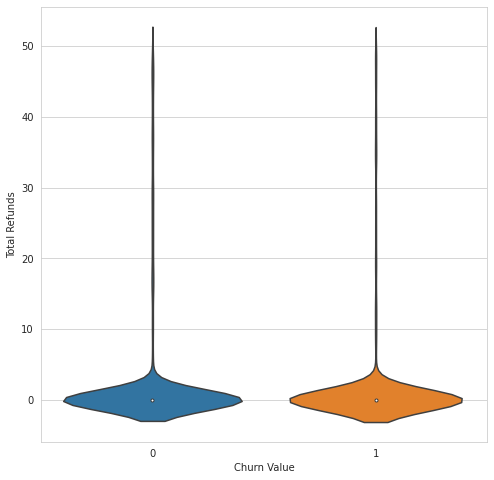

In [ ]:
plt.subplots(figsize=(8,8))
sns.violinplot(x='Churn Value',y='Total Refunds', data=df)
plt.show()

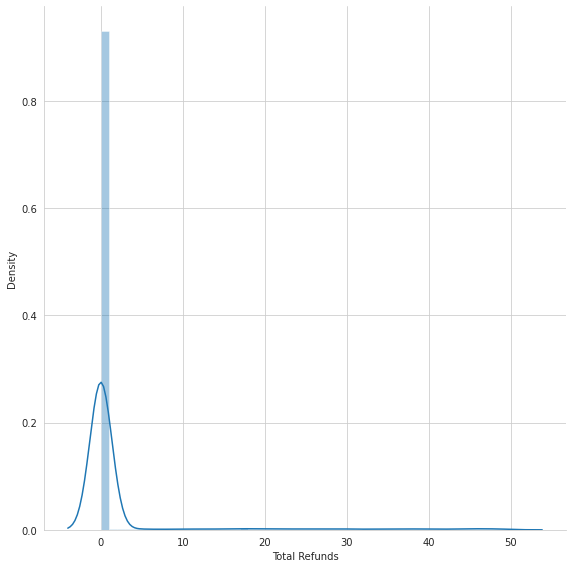

In [ ]:
sns.FacetGrid(df,height=8).map(sns.distplot,'Total Refunds').add_legend()
plt.show()

The total refunds feature does have a long tail and lot of outliers - but it should be OK, as that is the nature of this feature, as there is really no thumb rule on the optimum refund amount

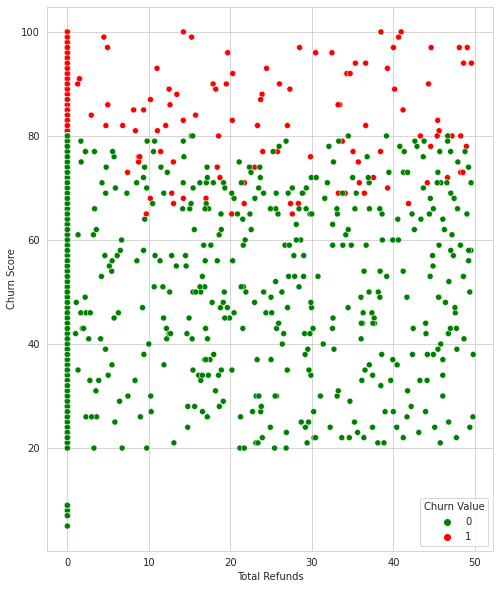

In [ ]:
plt.subplots(figsize=(8,10))
sns.scatterplot(x='Total Refunds',y='Churn Score',data=df,hue='Churn Value',palette=['green','red'])
plt.show()

As expected, the Total refunds issue will be None for most of the cases, only in case of disputes/cancellations it happens, so those values seem like outliers.

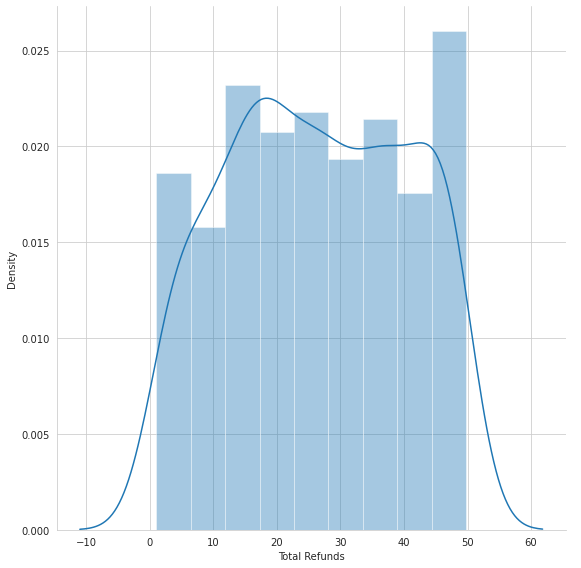

In [ ]:
sns.FacetGrid(df[df['Total Refunds']!=0],height=8).map(sns.distplot,'Total Refunds').add_legend()
plt.show()

If we remove the zero values, the distributions of the actual Total Refunds issued is close to a Normal Distribution. 

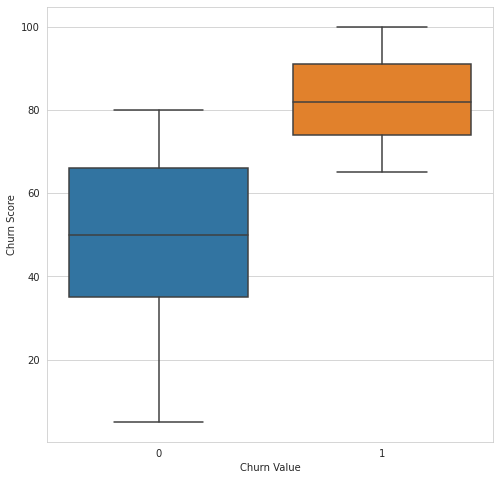

In [ ]:
plt.subplots(figsize=(8,8))
sns.boxplot(x='Churn Value',y='Churn Score', data=df)
plt.show()

Churn Score doesnt seem to have an outlier problem. Class separation is also very good for this feature

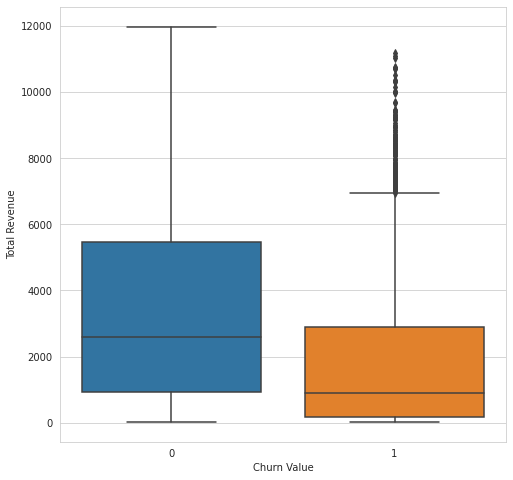

In [ ]:
plt.subplots(figsize=(8,8))
sns.boxplot(x='Churn Value',y='Total Revenue', data=df)
plt.show()

We will try to analyse further the seeming outliers in the Total Revenue feature for customers who have churned.

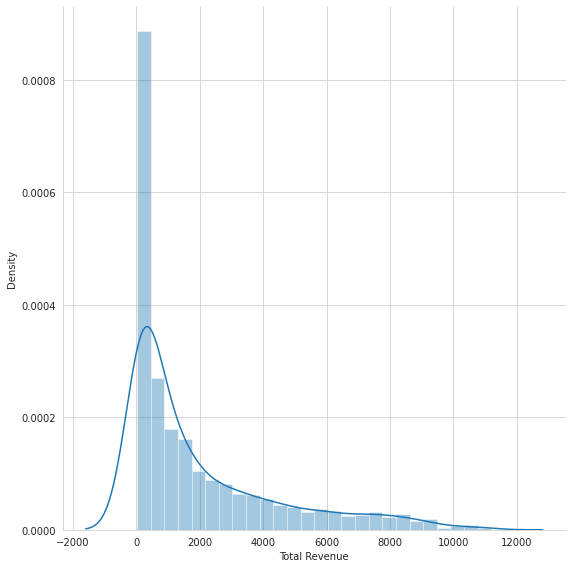

In [ ]:
sns.FacetGrid(df[df['Churn Value']==1],height=8).map(sns.distplot,'Total Revenue').add_legend()
plt.show()

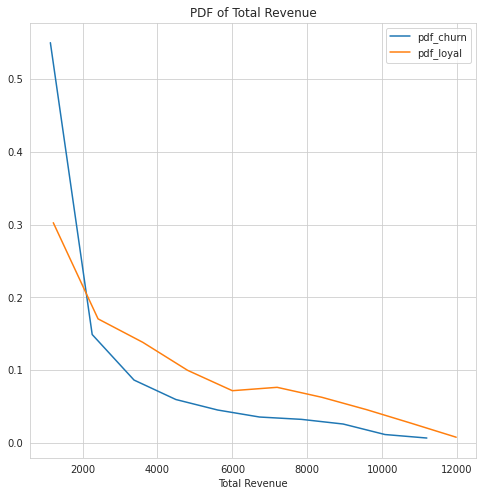

In [ ]:
plt.subplots(figsize=(8,8))
dftr= df[df['Churn Value']==1]
counts, bin_edges = np.histogram(dftr['Total Revenue'],bins=10,density=True)
pdf = counts/sum(counts)
plt.plot(bin_edges[1:],pdf,label= 'pdf_churn')
dftr2= df[df['Churn Value']==0]
counts, bin_edges = np.histogram(dftr2['Total Revenue'],bins=10,density=True)
pdf = counts/sum(counts)
plt.plot(bin_edges[1:],pdf,label= 'pdf_loyal')
plt.title("PDF of Total Revenue")
plt.xlabel('Total Revenue')
plt.legend()
plt.show()

Close to 60% of the Customers who churned have generated a revenue of around 1000 USD. Also we can see the overall Revenue generated by Loyal customers is higher than the churn customers across the revenue range.

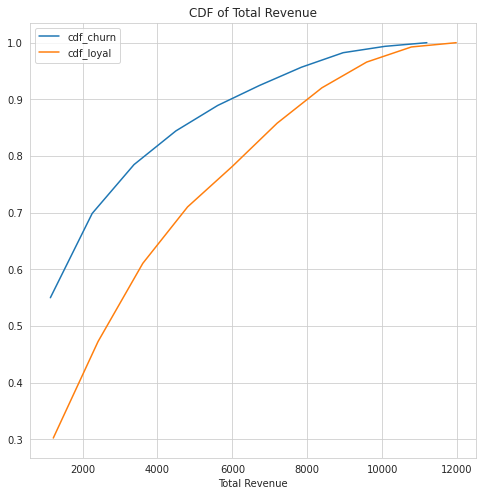

In [ ]:
plt.subplots(figsize=(8,8))
dftr= df[df['Churn Value']==1]
counts, bin_edges = np.histogram(dftr['Total Revenue'],bins=10,density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label= 'cdf_churn')

dftr2= df[df['Churn Value']==0]
counts, bin_edges = np.histogram(dftr2['Total Revenue'],bins=10,density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label= 'cdf_loyal')

plt.title("CDF of Total Revenue")
plt.xlabel('Total Revenue')
plt.legend()
plt.show()


Around 80% of the customers who have churned had a total revenue in the entire lifecycle - less 3000USD. Hence the rest of values, seem skewed. There doesnt seem to be any erroneous value in this column.

Consider the Loyal customers now. For the same 80% of the customers who have stayed, the total revenue is double of the churned customers ie USD 6000.

The reconfirms our inference till now, that Higher Revenue generation is a sign of customer loyalty and lower risk of churn

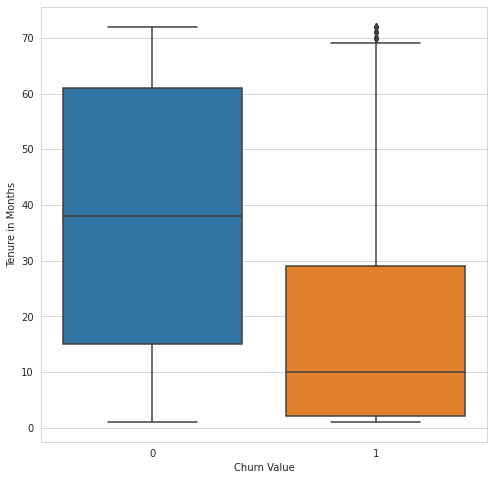

In [ ]:
plt.subplots(figsize=(8,8))
sns.boxplot(x='Churn Value',y='Tenure in Months', data=df)
plt.show()

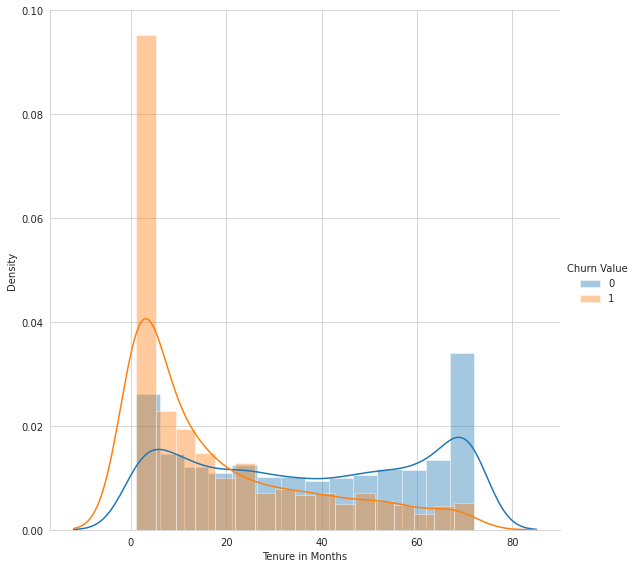

In [ ]:
sns.FacetGrid(df,height=8, hue='Churn Value').map(sns.distplot,'Tenure in Months').add_legend()
plt.show()

This plot clearly shows that customers who leave have Tenure centered around the lower side and the customer who stay seem to peak around higher side of the Tenure.

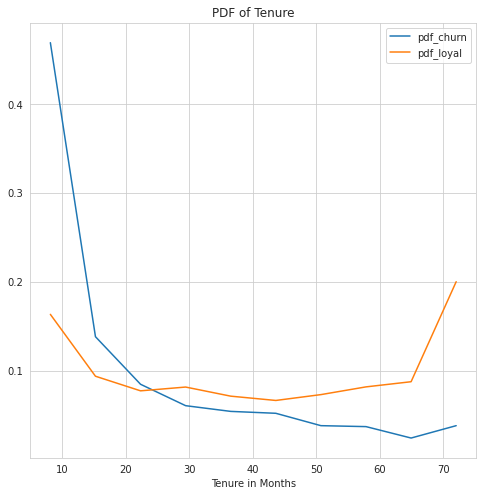

In [ ]:
plt.subplots(figsize=(8,8))
dftr= df[df['Churn Value']==1]
counts, bin_edges = np.histogram(dftr['Tenure in Months'],bins=10,density=True)
pdf = counts/sum(counts)
plt.plot(bin_edges[1:],pdf,label= 'pdf_churn')
dftr2= df[df['Churn Value']==0]
counts, bin_edges = np.histogram(dftr2['Tenure in Months'],bins=10,density=True)
pdf = counts/sum(counts)
plt.plot(bin_edges[1:],pdf,label= 'pdf_loyal')

plt.title("PDF of Tenure")
plt.xlabel('Tenure in Months')
plt.legend()
plt.show()


For Loyal Customers, 20% of them have stayed on for over around 6 years (72 months). While the around 20% of the churning customer left within a period of 10 months.

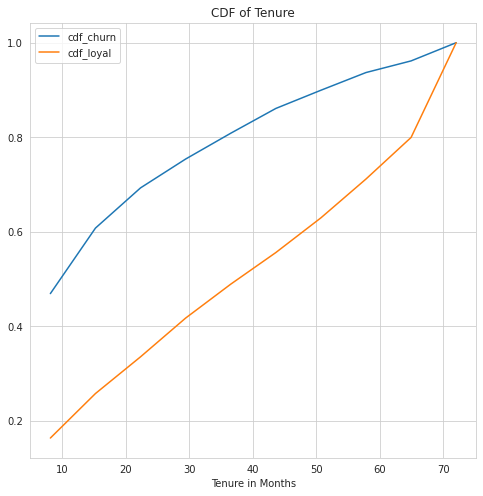

In [ ]:
plt.subplots(figsize=(8,8))
dftr= df[df['Churn Value']==1]
counts, bin_edges = np.histogram(dftr['Tenure in Months'],bins=10,density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label= 'cdf_churn')

dftr2= df[df['Churn Value']==0]
counts, bin_edges = np.histogram(dftr2['Tenure in Months'],bins=10,density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label= 'cdf_loyal')

plt.title("CDF of Tenure")
plt.xlabel('Tenure in Months')
plt.legend()
plt.show()

80% of the loyal customers stayed with the Telco for over 5 years. While 80% of the churned customers stayed for 3 years(36 months).

So clearly the Tenure of a customer with the Telco affects the churn risk.

#### Payment Method

In [ ]:
df['Payment Method'].value_counts()

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: Payment Method, dtype: int64

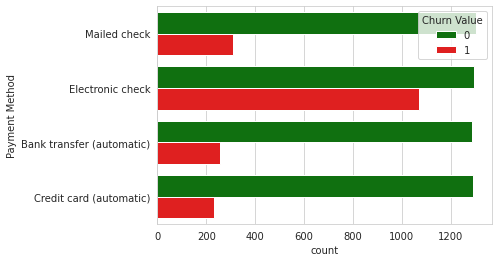

In [ ]:
sns.countplot(y = 'Payment Method', data = df, hue = "Churn Value", palette=['green','red'])
plt.show()

In [ ]:
paymentList = list(df['Payment Method'].unique())

In [ ]:
payChurn = {}
for p in paymentList:
  tc = len(df[df['Payment Method'] == p])
  churn = len(df[(df['Payment Method']== p) & (df['Churn Value']==1)])
  cr = np.round(churn/tc,2)
  payChurn[p] = cr
payChurn

{'Mailed check': 0.19,
 'Electronic check': 0.45,
 'Bank transfer (automatic)': 0.17,
 'Credit card (automatic)': 0.15}

As we can see almost half the customers that have subscribed to Electronic Check Payments churned. While the other payment methods have less that a fifth of the customers churning.

Payment Type-Electronic Check Feature has a high impact on the target variable.

**CLTV**

Customer Lifetime Value is an indicator of the customer value. The higher the CLTV, higher the customer value is to the Telco. This calculation is based on corporated formulas and is a blackbox to us. Let us try and understand this feature.

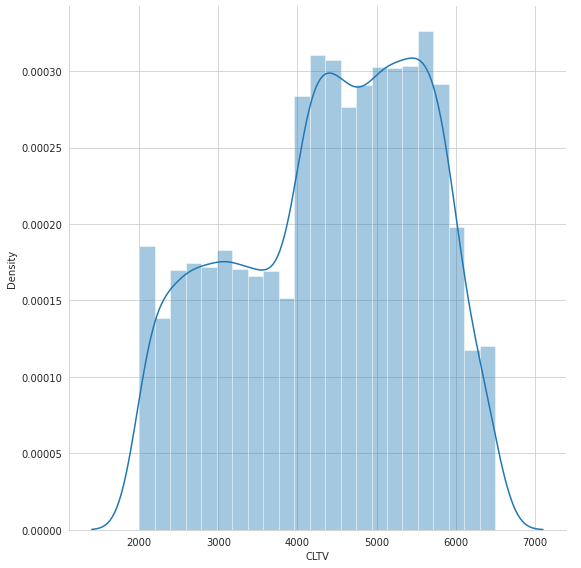

In [ ]:
sns.FacetGrid(df,height=8).map(sns.distplot,'CLTV').add_legend()
plt.show()

The density of customer with a CLTV score of above 4000 is higher when compared to the the ones less than 4000. Lets now see the class wise distributions

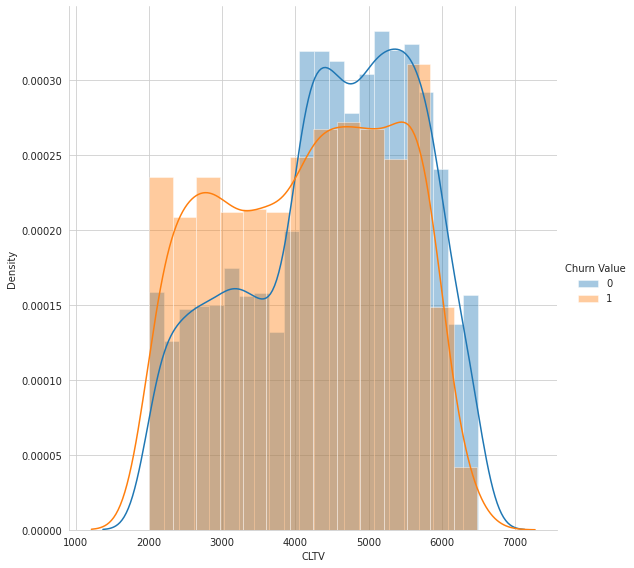

In [ ]:
sns.FacetGrid(df,height=8, hue='Churn Value').map(sns.distplot,'CLTV').add_legend()
plt.show()

High value customers (with CLTV around 6000) tend to be slightly more loyal to the Teleco than the lower valued ones. Churn rate is more or less the same, it slightly increases for high value customers, possibly because of higher number of customers in the second half of the scale.

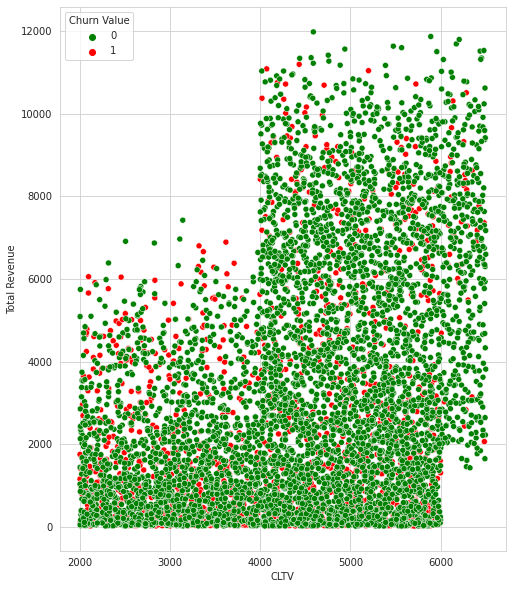

In [ ]:
plt.subplots(figsize=(8,10))
sns.scatterplot(x='CLTV',y='Total Revenue',data=df,hue='Churn Value',palette=['green','red'])
plt.show()

As we can see above, Customers with a revenue of around 6000 and above are marked as high valued customers. The total revenue for them is largely above 2000 USD

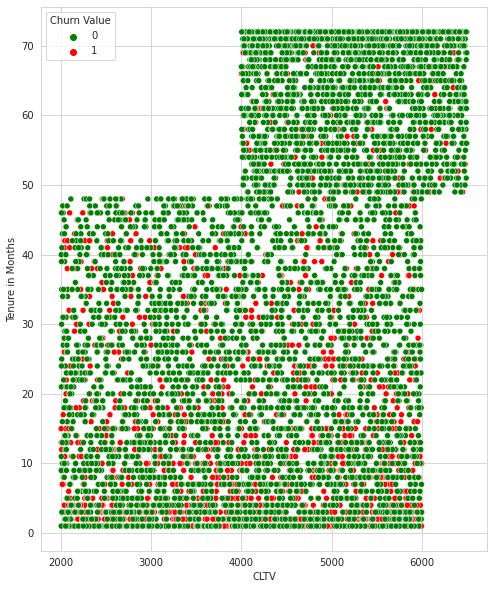

In [ ]:
plt.subplots(figsize=(8,10))
sns.scatterplot(x='CLTV',y='Tenure in Months',data=df,hue='Churn Value',palette=['green','red'])
plt.show()

It is also clear that customers who have been in the system for around 4 years are categorized as high value customers (CLTV around 6000)

Above, we had fixed 6000 as an approximate cutoff for high value customers. Now we will try to fix a more specific value.

In [ ]:
df['CLTV'].describe()

count    7043.000000
mean     4400.295755
std      1183.057152
min      2003.000000
25%      3469.000000
50%      4527.000000
75%      5380.500000
max      6500.000000
Name: CLTV, dtype: float64

We could group the top 25% as high value customers ie CLTV of 5380 and above.
And the first 25% of CLTV ie less than 3470 as lower value customers and verify their respective churn rates

In [ ]:
print('Churn rate for High Value Customers is {} %'.format(round(df[df['CLTV']>=5380]['Churn Value'].sum()*100/len(df[df['CLTV']>=5380]['Churn Value']),2)))

Churn rate for High Value Customers is 20.7 %


In [ ]:
print('Churn rate for Lower Value Customers is {} %'.format(round(df[df['CLTV']<3470]['Churn Value'].sum()*100/len(df[df['CLTV']<3470]['Churn Value']),2)))

Churn rate for Lower Value Customers is 34.43 %


The highest band of valued customers (top 25%) have a Churn rate of around 21%. This will be an area of concern for the telecom provider as this could cause a major revenue impact. 

To predict the churn risk for this band without/with very minimal False Positives, would be a test of our model.

Let us now tackle the NULL values in Total Charges feature.

For Missing total charges it seems like an error, as we have other charges present. As we saw above - Total revenue is a sum of the different charge heads. We will work backwards to arrive at the missing "Total Charges" values.

In [ ]:
df['Total Charges'].isnull().values.any()

True

In [ ]:
len(df[df['Total Charges'].isnull()])

11

In [ ]:
df.loc[df['Total Charges'].isnull(), ['Total Charges']] = df['Total Revenue'] - df['Total Extra Data Charges'] - df['Total Long Distance Charges'] + df['Total Refunds']

In [ ]:
df.drop(['Churn Reason', 'Churn Category'], axis=1).isnull().values.any()

False

All null values are handled.

We will now perform Anova Test and Chi Squared test to check usefulness of numerical and categorical features respectively

In [ ]:
dff= df.copy()

In [ ]:
# Replace Zip Code and City - to City wise and Zip wise churn rates that we saw in the analysis done already.
dff['ZipChurnRate'] = dff['Zip Code'].apply(lambda x: len(dff[(dff['Zip Code']==x) & (dff['Churn Value']==1) ])/len(dff[dff['Zip Code']==x]) )
dff['CityChurnRate'] = dff['City'].apply(lambda x: len(dff[(dff['City']==x) & (dff['Churn Value']==1) ])/len(dff[dff['City']==x]))
# Replace Customer Status with joined or not.
dff['Joined'] = dff['Customer Status'].apply(lambda x : 'Yes' if x=='Joined' else 'No')
dff.drop(['Zip Code','City','Customer Status'], axis=1, inplace=True)
# Remove Post Churn information features for now, as they are direct consequence of a churn happening or not (Same as Churn Value).
dff.drop(['Churn Category','Churn Reason'], axis=1, inplace=True)

In [ ]:
objLst = list(dff.select_dtypes(include=['object']).columns.sort_values())
numLst = list(dff.select_dtypes(exclude=['object']).columns.sort_values())
numLst.remove('Churn Value')

### One-Way ANOVA Test

We will perform the ANOVA test for numerical features to test their usefulness in predicting the class label: Churn Value.

Analysis of Variance is used to verify if the means of two or more sample groups are different from each other.
If the sample distributions are different then the total mean is significantly different from the individual means.

The Null Hypothesis H0 : All sample distributions are same.

The Alternate Hypothesis H1: One or more sample distributions are not the same.

If the p-value is less than or equal to the chosen significance value alpha, then we reject the Null Hypothesis. In other words the feature and class label are associated and that feature is useful in class separation. We will select this feature.

And in the other case, we will accept H0 and conclude that the feature is not important.

In [ ]:
alpha = 0.05 # set alpha 
fStatLst = []
for col in numLst:
	# Split each feature based on the churn value - 2 groups in our case.
	stat, p = f_oneway(dff[col][dff['Churn Value'] == 0],dff[col][dff['Churn Value'] == 1])
	fStatLst.append(stat)
	if p>alpha:
		print(col, ": Accept H0 - Feature not useful")

Avg Monthly Long Distance Charges : Accept H0 - Feature not useful
Latitude : Accept H0 - Feature not useful
Longitude : Accept H0 - Feature not useful
Population : Accept H0 - Feature not useful
Total Extra Data Charges : Accept H0 - Feature not useful


The above features have similar group sample distributions as per our null hypothesis - hence are not useful in class separation.

In [ ]:
featScore_dict = {}
featScore_dict['Features'] = numLst                               
featScore_dict['F Stat'] = fStatLst

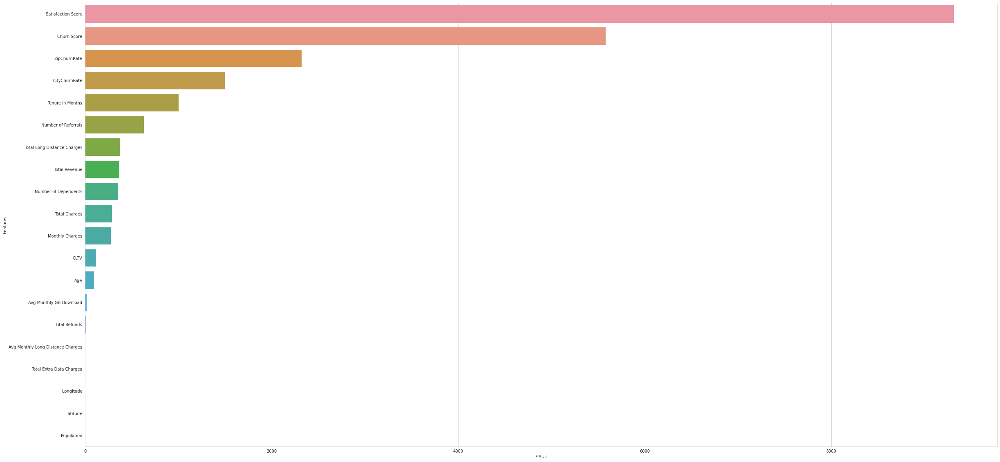

In [ ]:
sns.set_style('whitegrid')
plt.subplots(figsize=(40,20))
sns.barplot(data = pd.DataFrame(data = featScore_dict).sort_values(by='F Stat', ascending=False), y='Features', x='F Stat')
plt.show()

Visualization of the F-stat score also confirms the inference of the hypothesis testing, in terms of feature importance.

As we can see Satisfaction Score has the highest relevance to classifying the Churn Score followed by the Churn Score.

It is also seen that the Zipwise and Citywise Churn rates have a good impact on the target variable. We will be performing response coding of these features in the sections coming below.

Tenure in months, Charges and Referral information will also help in class separation - this confirms the analysis we had done earlier.

As we had already seen above, charge components like refunds, data or long distance charges have no/negligable effect. This information is already included in the Total Revenue - which in turn has a considerable impact.

Lastly Population and location coordinates - are of no relevance at all to the problem we are trying to solve. We could try removing these features and see if the model performance improves.

### Chi2 Test for contingency

Let us make the Hypothesis for Chi2 test of independence, for categorical features.

The Null Hypothesis H0 : The feature and 'Churn Value' class label are independent.

The Alternate Hypothesis H1: The feature and 'Churn Value' class label are dependent.

If the p-value is less than or equal to  the chosen significance value alpha, then we reject the Null Hypothesis. In other words the feature and class label are associated and that feature is useful in class separation. 
We will select this feature.

And in the other case, we will accept H0 and conclude that the feature is not important.

In [ ]:
#df_obs = pd.crosstab(df['Contract'],df['Churn Value'])
#df_obs

In [ ]:
alpha = 0.05 # set alpha 
chi2Lst = []
for col in objLst: # Test All Categorical Features
  df_obs = pd.crosstab(dff['Churn Value'],dff[col]) # Create contingency table for this feature and class label
  chi2, p, dof, expected = chi2_contingency(df_obs)
  chi2Lst.append(chi2)
  if p>alpha:
    print(col, ": Accept H0 - Feature not useful")

Gender : Accept H0 - Feature not useful
Phone Service : Accept H0 - Feature not useful


In [ ]:
featScore_dict = {}
featScore_dict['Features'] = objLst                               
featScore_dict['chi2 Stat'] = chi2Lst

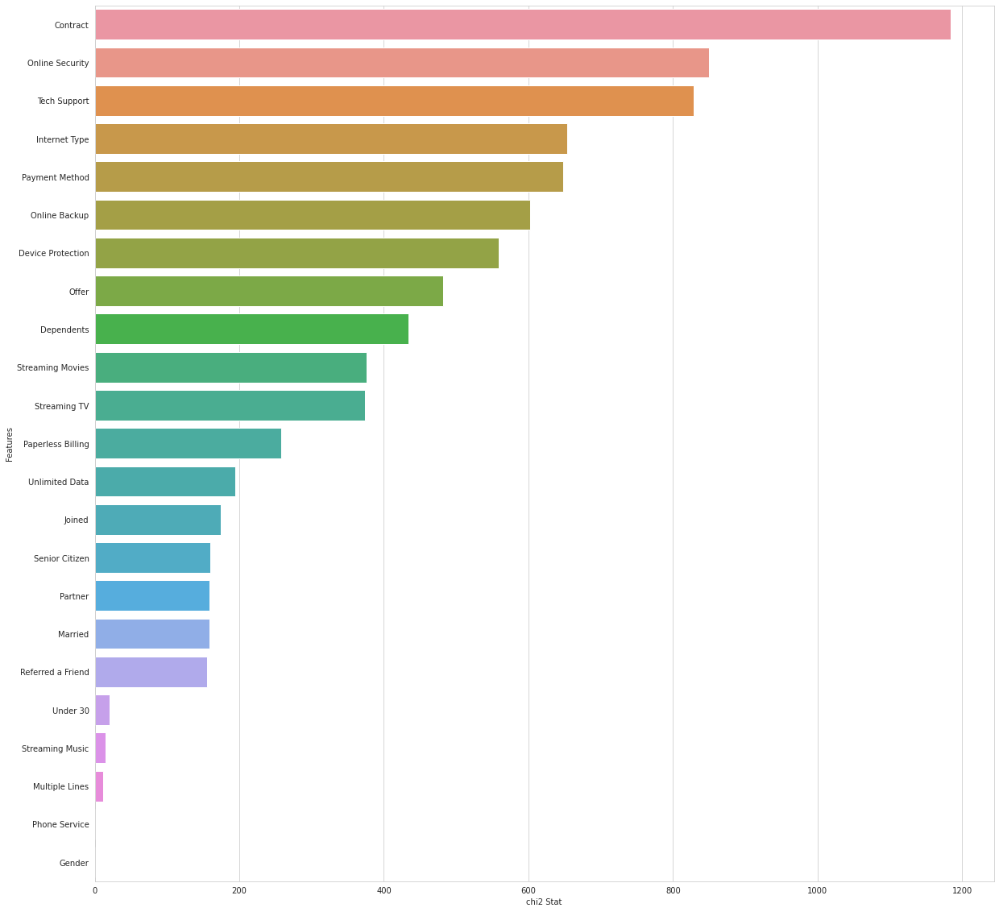

In [ ]:
sns.set_style('whitegrid')
plt.subplots(figsize=(20,20))
sns.barplot(data = pd.DataFrame(data = featScore_dict).sort_values(by='chi2 Stat', ascending=False), y='Features', x='chi2 Stat')
plt.show()

Higher Chi2 Statistic means the observed and expected frequencies differ more and the feature is associated with the Class Label. Hence that feature is useful to us.

The significance test and the chisquare score plot - help us infer that Phone Service and Gender are not important features.

Contractual Duration clearly seperates the classes. Longer contract customers tend to churn less.

Also we see in the top scores, features related to add on products like Online back up, security etc. We also inferred fro EDA earlier that the customers are likely to have invested in these add ons as they are happy with the Service Provider.

Gender stands out as one feature, that does not really help in our classification. Churn seems to happen or not irrespective of the customer gender. We could try dropping this feature and look for any performance improvement.

###Conclusions from EDA###

We have now merged all the features from the different datasets, removed duplicate information, fixed inconsistencies like feature datatypes/ empty strings, checked for any outlier problems, identified features that have a high correlation with the class label and experimented with a few new features - the effect on class separation.

Churn Score, Tenure, Total Revenue, Satisfaction Score, Subscription to Value Added Services like Online Back up, Demographics like higher dependents, Married etc, Number of referrals, Contract Period - have a positive correlation on the class outcome.

New features like ZipCode_ChurnRate, City_ChurnRate, AverageMonthlyRevenue, AgeUnder65, Joined - worked well when experimented with.

We did the ANOVA and CHI-Square tests and infer that 'Population', 'Latitude', 'Longtitude', 'Phone Service', 'Total Extra Data Charges', 'Average Monthly Long Distance Charges' and 'Gender' have no relevance to the target label classification.

In [ ]:
# Save the dataframe.
#df.to_excel('/content/gdrive/My Drive/CaseStudy/df_EDAdone.xlsx',index=False)

In [ ]:
#df = pd.read_excel('/content/gdrive/My Drive/CaseStudy/df_EDAdone.xlsx')
#df.info()

###Feature Engineering

Based on the insights from the Analysis of the data above, we will engineer/transform a few features and remove a few features that are not useful/are redundant. 
The details of the analysis are in the EDA section

The two features Zip Code and City we will transform using Response Coding, after the Train Test Split. As in real time, we will not know before hand the cities or zipcodes that are to come during run time. Hence it would not be appropriate to calculate probablities by including test data information at this stage. 
Hence these two feature transformations are handled post Test Data split.

Now let us look at the other features

Age Under 65: A new feature that separates the customers based on their age being over 65, offered better class separation.

In [ ]:
df['Under65'] = df['Age'].apply(lambda x: 'Yes' if x<65 else 'No')

In [ ]:
df['Under65'].value_counts()

Yes    5901
No     1142
Name: Under65, dtype: int64

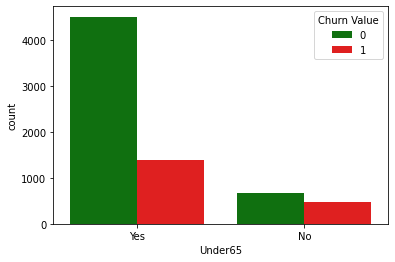

In [ ]:
sns.countplot(x = 'Under65', data = df, hue = "Churn Value", palette=['green','red'])
plt.show()

For the Under65 category, the churned count is around a quarter of the not churned. While the ratio of churned vs. not churned is around 3:4 - Hence if the customer age is above 65 - the chances of churn is high compared to the ones below 65. This information should be useful to separate the classes.

Monthly Revenue - Average Monthly Revenue of the customer, to give a monthly perspective and standardization across all customers irrespective of the tenure.

In [ ]:
df['MonthlyRevenue'] = df['Total Revenue']/df['Tenure in Months']

In [ ]:
df['MonthlyRevenue'].describe()

count    7043.000000
mean       88.120156
std        35.910838
min        18.166000
25%        56.765136
50%        93.246364
75%       117.016111
max       190.700000
Name: MonthlyRevenue, dtype: float64

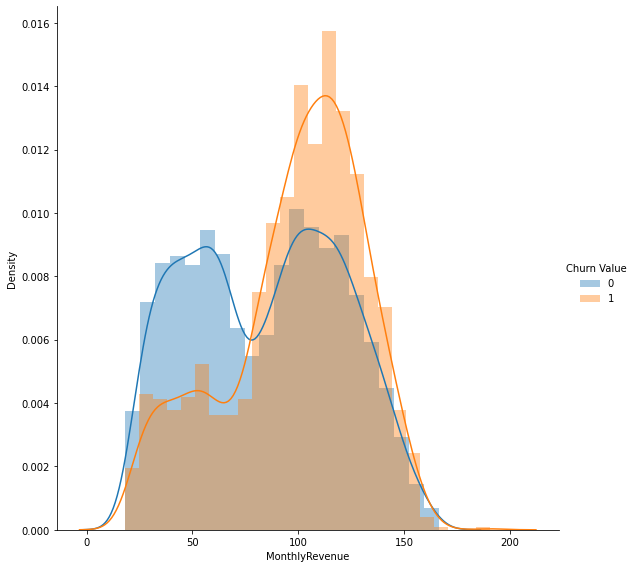

In [ ]:
sns.FacetGrid(df,hue='Churn Value',height=8).map(sns.distplot,'MonthlyRevenue').add_legend()
plt.show()

At around 80 USD Revenue per month, we can see a change in trend. For customer below 80 USD, Churn rate is lower but there is a sharp increase after that, while the density of customers who did not churn remains more or less the same. So this could be a useful factor in the class separation.

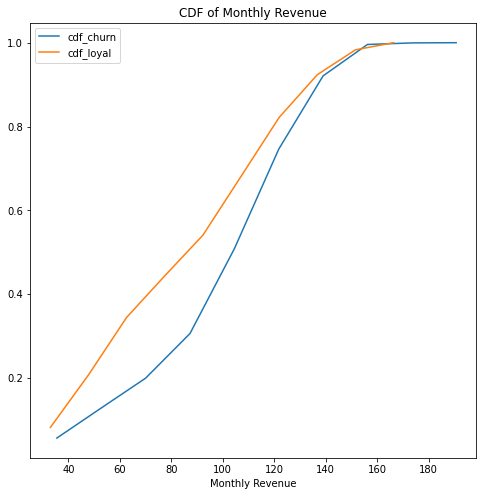

In [ ]:
plt.subplots(figsize=(8,8))
dftr= df[df['Churn Value']==1]
counts, bin_edges = np.histogram(dftr['MonthlyRevenue'],bins=10,density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label= 'cdf_churn')

dftr2= df[df['Churn Value']==0]
counts, bin_edges = np.histogram(dftr2['MonthlyRevenue'],bins=10,density=True)
pdf = counts/sum(counts)
cdf = np.cumsum(pdf)
plt.plot(bin_edges[1:],cdf,label= 'cdf_loyal')

plt.title("CDF of Monthly Revenue")
plt.xlabel('Monthly Revenue')
plt.legend()
plt.show()

The CDF Monthly Revenue for Loyal Customers is above that of the Churned Customers. Around 50% of the loyal customer had revenue of around 80 USD. But only 25% of the churned customers had a revenue of 80 USD.

Customer Status - Joined information is extracted from this. The other statuses Stayed/Churned is the target variable itself and hence not useful in the model training. Stayed/Churned will be known after the event and not for a query point whose churn status is to be predicted.

In [ ]:
df['Joined'] = df['Customer Status'].apply(lambda x : 'Yes' if x=='Joined' else 'No')

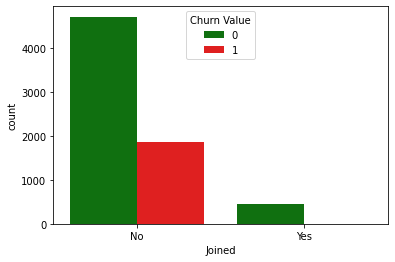

In [ ]:
sns.countplot(x = 'Joined', data = df, hue = "Churn Value", palette=['green','red'])
plt.show()

100% of the customers who have Joined (1,2,3 months in tenure) have not churned - a useful class separation feature.

Payment Method - Electronic Check - We will create a new feature for payment type Electronic Check - Yes or No - as it showed a good chance of class separation in our EDA.

In [ ]:
df['Electronic Check'] = df['Payment Method'].apply(lambda x : 'Yes' if x=='Electronic check' else 'No')

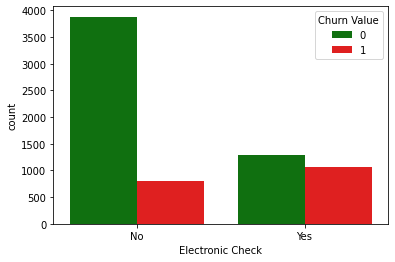

In [ ]:
sns.countplot(x = 'Electronic Check', data = df, hue = "Churn Value", palette=['green','red'])
plt.show()

Churn Rate of Customers with Electronic Check payment method is nearly the same as the stay rate. On the contrary Churn rate is much lower for customers with payment methods other than Electronic Check.

We will drop the redundant features as seen in the EDA section

In [ ]:
df.drop(['Under 30', 'Total Charges',  'Total Extra Data Charges', 'Total Long Distance Charges', 'Total Refunds', 'Customer Status'], axis=1, inplace=True)

Churn Reason & Churn Category

Now, we have two features that indicate the reason for Churn: Churn Category and Churn Reason. Both these features contain information post the event of churn. Hence in real time when the model would predict the churn risk of a customer or a set of customers, this information will not be available.  

If these features are included in the training data - then the model would simply learn to predict the churn rate as 0 - if the Churn Reason/Category columns are empty. The model will not learn from the other features and weights associated.

Therefore it doesn't make sense to train the model with these features. We will remove Churn Category and Churn Reason.

We have used this information to understand the insight into the customer leaving the Service Provider. And the business behind the churn analysis by understanding the other features in the light of these three features.


In [ ]:
df.drop(['Churn Reason','Churn Category'], axis=1, inplace=True)

We will also remove other unimportant features we identified after the ANOVA and Chi-Square tests.

In [ ]:
df.drop(['Gender','Population','Latitude','Longitude','Phone Service', 'Avg Monthly Long Distance Charges'], axis=1, inplace=True)

In [ ]:
df.columns

Index(['City', 'Zip Code', 'Senior Citizen', 'Partner', 'Dependents',
       'Multiple Lines', 'Online Security', 'Online Backup',
       'Device Protection', 'Tech Support', 'Streaming TV', 'Streaming Movies',
       'Contract', 'Paperless Billing', 'Payment Method', 'Monthly Charges',
       'Churn Value', 'Churn Score', 'CLTV', 'Referred a Friend',
       'Number of Referrals', 'Tenure in Months', 'Offer', 'Internet Type',
       'Avg Monthly GB Download', 'Streaming Music', 'Unlimited Data',
       'Total Revenue', 'Age', 'Married', 'Number of Dependents',
       'Satisfaction Score', 'Under65', 'MonthlyRevenue', 'Joined',
       'Electronic Check'],
      dtype='object')

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 36 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   City                     7043 non-null   object 
 1   Zip Code                 7043 non-null   int64  
 2   Senior Citizen           7043 non-null   object 
 3   Partner                  7043 non-null   object 
 4   Dependents               7043 non-null   object 
 5   Multiple Lines           7043 non-null   object 
 6   Online Security          7043 non-null   object 
 7   Online Backup            7043 non-null   object 
 8   Device Protection        7043 non-null   object 
 9   Tech Support             7043 non-null   object 
 10  Streaming TV             7043 non-null   object 
 11  Streaming Movies         7043 non-null   object 
 12  Contract                 7043 non-null   object 
 13  Paperless Billing        7043 non-null   object 
 14  Payment Method          

In [ ]:
df.head(3)

,City,Zip Code,Senior Citizen,Partner,Dependents,Multiple Lines,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Churn Value,Churn Score,CLTV,Referred a Friend,Number of Referrals,Tenure in Months,Offer,Internet Type,Avg Monthly GB Download,Streaming Music,Unlimited Data,Total Revenue,Age,Married,Number of Dependents,Satisfaction Score,Under65,MonthlyRevenue,Joined,Electronic Check
0,Los Angeles,90003,No,No,No,No,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,1,86,3239,No,0,2,None,DSL,21,No,Yes,129.09,37,No,0,1,Yes,64.5450,No,No
1,Los Angeles,90005,No,No,Yes,No,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,1,67,2701,No,0,2,None,Fiber Optic,51,No,Yes,169.89,19,No,2,2,Yes,84.9450,No,Yes
2,Los Angeles,90006,No,No,Yes,Yes,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,1,86,5372,No,0,8,None,Cable,26,Yes,Yes,917.70,31,No,2,3,Yes,114.7125,No,Yes


In [ ]:
# Save the dataframe.
#df.to_excel('/content/gdrive/My Drive/CaseStudy/df_FEdone.xlsx',index=False)

We add the following new features to our dataset:

1. Under 65
2. Joined
3. Electronic Check
4. Monthly Revenue

(After Train_Test Split:)
5. Zip Churn Rate
6. City Churn Rate
7. Zip Stay Rate
8. City Stay Rate 

This concludes the Feature Engineering part.

Continued in PART-2